## Packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import NMF
from numpy import asarray
from numpy import savetxt
import matplotlib.colors as mcolors
import matplotlib.cm
import matplotlib.patches as mpatches
import umap
import matplotlib as mpl
import scanpy as sc
import scipy
import kmapper as km
from kmapper import jupyter
from kmapper.plotlyviz import plotlyviz
from kmapper.plotlyviz import *
import plotly.graph_objs as go
import sys
from sklearn import ensemble
import tqdm
from ripser import Rips
from ripser import ripser
from persim import plot_diagrams
from sklearn.metrics.pairwise import euclidean_distances
import umap
from numpy import random
from sklearn.decomposition import PCA
from mpl_toolkits import mplot3d

In [2]:
# ----------------------- Palettes ------------------------

blue = ["blue", "cornflowerblue", "lightskyblue"]
red = ["maroon", "indianred", "salmon"]
orange = ["orangered","coral", "orange"]
purple = ["indigo", "rebeccapurple", "mediumpurple"]
green = ["darkgreen", "limegreen", "lightgreen"]
yellow = ["darkgoldenrod", "goldenrob", "gold"]
teal = ["darkcyan","lightseagreen","paleturquoise"]

pal_array = np.array([np.array(blue), np.array(red), np.array(orange), np.array(purple), np.array(green), np.array(yellow), np.array(teal)])

custom_palette = pd.DataFrame(pal_array, index = ["blue", "red", "orange", "purple", "green", "yellow", "teal"], columns = ["dark", "medium", "light"])

In [3]:
def persistance_diagram(expression_matrix, color, title_plt):
    
    # expression_matrix - expression matrix to be fed into Risper (will be transposed)
    # color - "blue", "red", "orange", "purple", "green", "yellow"
    # title_plt - title for returned persistance diagram
    # returns birth-death pairs for lifetime
    
    bd = ripser(expression_matrix.T, maxdim=1)['dgms']
    
    xy_H_0 = bd[0]
    xy_H_1 = bd[1]

    y_max = sorted(list(xy_H_0[:,1]))[-2]
    print(sorted(list(xy_H_0[:,1]))[-1])
    x_max = sorted(list(xy_H_1[:,1]))[-1]
    either_max = np.amax(np.array([x_max, y_max]))
    
    buffer = either_max*0.1
    
    x = np.linspace(-1*buffer,either_max,500)

    plt.figure(figsize=(5, 5))
            
    sns.scatterplot(xy_H_0[:,0], xy_H_0[:,1], hue = np.ones(xy_H_0.shape[0]), s = 5, linewidth=0, palette = [custom_palette.loc[color]["medium"]], label = "H_0")
    sns.scatterplot(xy_H_1[:,0], xy_H_1[:,1], hue = np.ones(xy_H_1.shape[0]), s = 5, linewidth=0, palette = [custom_palette.loc[color]["dark"]], label = "H_1")
    plt.plot(x, x, ':k', label='Birth = Death')
    plt.plot(x, either_max*np.ones(x.shape), ':k', label='Fully Connected Component')
    plt.ylabel('Death')
    plt.xlabel('Birth')
    plt.ylim((-1*buffer,either_max*1.1))
    plt.xlim((-1*buffer,either_max*1.1))
    plt.title(title_plt)
    plt.legend(bbox_to_anchor=(1.2, 1),borderaxespad=0)
    #plt.savefig('.png')
    plt.show()
    
    return bd, color

In [4]:
def violin_lifetime(bd, data_type, color, sublabel):
    #bd and color sane as persistance_diagram
    #data_type refers to 0:All genes, 1:Cell cycle genes, 2:Random genes_1
    
    if data_type==0:
        y_label = "All Genes"
        y_top = 100
    elif data_type==1:
        y_label = "Cell Cycle Genes"
        y_top = 20
    else:
        y_label = "Random Genes"
        y_top = 5
    
    H_1 = np.array(bd[1])
    lifetime = []

    for i in range(H_1.shape[0]):
        lifetime.append(H_1[i, 1] - H_1[i, 0]) #append lifetime of each feature
    
    lifetime = np.reshape(np.array(lifetime), (H_1.shape[0],1))

    plt.figure(figsize=(2,5))
    sns.violinplot(y=lifetime, palette = [custom_palette.loc[color][data_type]])
    sns.swarmplot(x=np.array([y_label]), y=np.array([np.amax(lifetime)]), color=custom_palette.loc[color][0], s = 10)
    plt.ylabel("Lifetime of H1 features")
    plt.xlabel(sublabel, fontsize=8)
    plt.ylim((0,y_top))
    plt.show()
    


In [5]:
def visualize(data, pca_n, plot_label, hue):
    # data - the data used for pca and umap, will take transpose so should be rows-genes, cols-samples
    # pca_n - number of components used for pca, for full genes use 20, else 4 or 3 depending on number of genes used
    # plot_label - the title given to generated plots
    # hue - 0,1,2 for whether the color scheme should be the dark, medium, or light version 0-All Genes, 1-Cell Cycle Genes, 2-Random Genes
    pca = PCA(n_components=pca_n)
    pca.fit(data.T)
    X = pca.transform(data.T)
    print(X.shape)

    reducer = umap.UMAP(random_state=42, n_components=2)
    embedding = reducer.fit_transform(X)
    print(embedding.shape)
    
    reducer_3 = umap.UMAP(random_state=42, n_components=3)
    embedding_3 = reducer_3.fit_transform(X)
    print(embedding_3.shape)
    
    #var = np.array(pca.explained_variance_ratio_)
    #pcs = np.arange(1,21)

    #sns.scatterplot(pcs, var)
    #plt.ylabel('Explained variance ratio')
    #plt.xlabel('Principle components')
    #plt.show()
    
    plt.figure(figsize=(8, 6))
            
    sns.scatterplot(embedding[:,0], embedding[:,1], hue = np.ones(embedding.shape[0]), s = 20, linewidth=0, palette = [color_selection[hue]])

    plt.ylabel('UMAP2')
    plt.xlabel('UMAP1')
    plt.title(plot_label)
    plt.legend(bbox_to_anchor=(1.2, 1),borderaxespad=0)
    #plt.savefig('.png')
    plt.show()
    
    fig = plt.figure()
    ax = plt.axes(projection='3d')
    ax.scatter3D(embedding_3[:,0], embedding_3[:,1], embedding_3[:,2], c=color_selection[hue])
    plt.show()
    
    data = data.T
    fig = plt.figure()
    ax = plt.axes(projection='3d')
    ax.scatter3D(data[:,0], data[:,1], data[:,2], c=color_selection[hue])
    plt.show()
    
    fig = plt.figure()
    ax = plt.axes(projection='3d')
    ax.scatter3D(data[:,1], data[:,2], data[:,0], c=color_selection[hue])
    plt.show()
    
    fig = plt.figure()
    ax = plt.axes(projection='3d')
    ax.scatter3D(data[:,2], data[:,0], data[:,0], c=color_selection[hue])
    plt.show()

## Read in data

In [6]:
gene_expression = pd.read_csv("final_geneexpression.csv", sep=',', header = 0, index_col = 0)
labels = pd.read_csv("final_labels.csv", sep=',', header = 0, index_col = 0)

In [7]:
gene_expression

,20170905-A01,20170905-A02,20170905-A03,20170905-A06,20170905-A07,20170905-A08,20170905-A09,20170905-A10,20170905-A11,20170905-A12,...,20170924-G05,20170924-G06,20170924-G07,20170924-G09,20170924-G12,20170924-H03,20170924-H05,20170924-H07,20170924-H08,20170924-H11
EGFP,22,12,43,31,56,30,28,26,15,27,...,41,37,46,13,31,3,6,35,39,30
ENSG00000000003,14,8,3,7,11,18,3,5,8,9,...,17,4,8,1,6,2,16,9,17,5
ENSG00000000419,11,6,3,4,1,7,9,10,3,9,...,9,11,3,6,8,7,14,7,12,6
ENSG00000000457,0,0,0,0,0,0,1,0,0,0,...,0,0,0,1,0,0,0,4,1,1
ENSG00000000460,3,0,2,4,1,0,4,1,0,1,...,5,0,3,1,2,0,4,1,2,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ERCC-00163,1,0,1,3,1,3,1,0,3,0,...,1,0,0,0,0,2,1,1,3,1
ERCC-00165,8,4,1,2,3,2,0,2,5,1,...,1,0,0,1,1,2,3,4,5,3
ERCC-00170,0,1,5,1,1,0,0,0,0,3,...,0,1,0,2,0,1,0,0,0,1
ERCC-00171,147,167,171,154,179,167,168,167,147,166,...,183,162,170,145,142,168,174,148,168,156


In [8]:
labels

,experiment,well,cell_number,concentration,ERCC,individual.1,individual.2,image_individual,image_label,raw,...,rfp.median.log10sum,gfp.median.log10sum,dapi.median.log10sum,rfp.median.log10sum.adjust,gfp.median.log10sum.adjust,dapi.median.log10sum.adjust,size,perimeter,eccentricity,theta
20170905-A01,20170905,A01,1,1.726404,50x dilution,NA18855,NA18870,18870_18855,3,5746265,...,2.744765,2.954637,3.083036,0.415319,0.149738,0.269229,1358,113,0.581639,4.374619
20170905-A02,20170905,A02,1,1.445693,50x dilution,NA18855,NA18870,18870_18855,2,3997709,...,2.252281,2.518825,2.696254,-0.013086,-0.260776,-0.110300,723,81,0.508793,2.252635
20170905-A03,20170905,A03,1,1.889617,50x dilution,NA18855,NA18870,18870_18855,1,4765829,...,2.850892,3.197764,2.955256,0.329710,0.281079,0.112117,2937,172,0.433768,4.820316
20170905-A06,20170905,A06,1,2.135352,50x dilution,NA18855,NA18870,18870_18855,51,5249443,...,1.761813,2.941773,3.062226,-0.231238,0.128699,0.162145,1359,115,0.509744,0.246863
20170905-A07,20170905,A07,1,1.999640,50x dilution,NA18855,NA18870,18870_18855,6,5084206,...,2.021554,3.265179,3.169831,-0.333604,0.420206,0.224290,1795,141,0.809687,6.061320
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20170924-H03,20170924,H03,1,1.403619,50x dilution,NA18870,NA19160,19160_18870,45,3544487,...,1.988120,1.808922,2.087316,-0.251185,-0.948892,-0.680583,479,74,0.897233,2.157482
20170924-H05,20170924,H05,1,2.413250,50x dilution,NA18870,NA19160,19160_18870,92,4087535,...,1.770559,2.795882,3.130760,-0.463508,0.109938,0.242358,2965,393,0.884826,0.530167
20170924-H07,20170924,H07,1,2.498777,50x dilution,NA18870,NA19160,19160_18870,46,3917460,...,2.131801,2.620315,2.995700,-0.089174,-0.234285,0.071378,1069,118,0.864127,2.043785
20170924-H08,20170924,H08,1,0.502145,50x dilution,NA18870,NA19160,19160_18870,47,4132349,...,1.964830,2.303479,2.816438,-0.498783,-0.543224,-0.073613,1375,147,0.947345,1.778055


In [9]:
pca = PCA(n_components=20)
pca.fit(gene_expression.values.T)
X = pca.transform(gene_expression.values.T)
print(X.shape)
    
reducer = umap.UMAP(random_state=42, n_components=2)
embedding = reducer.fit_transform(X)
print(embedding.shape)

(888, 20)
(888, 2)


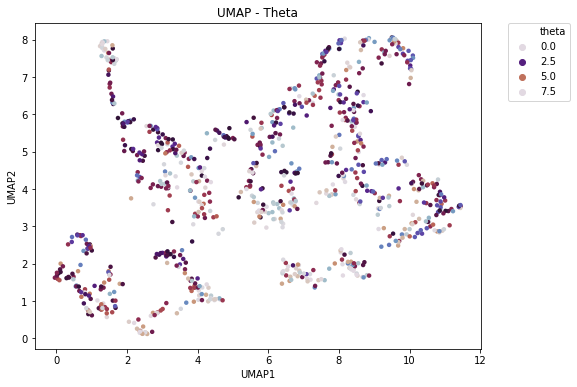

In [10]:
plt.figure(figsize=(8, 6))
            
sns.scatterplot(embedding[:,0], embedding[:,1], hue = labels["theta"], s = 20, linewidth=0, palette = "twilight", hue_norm = (0,2*3.1415))

plt.ylabel('UMAP2')
plt.xlabel('UMAP1')
plt.title('UMAP - Theta')
plt.legend(bbox_to_anchor=(1.2, 1),borderaxespad=0)
#plt.savefig('.png')
plt.show()

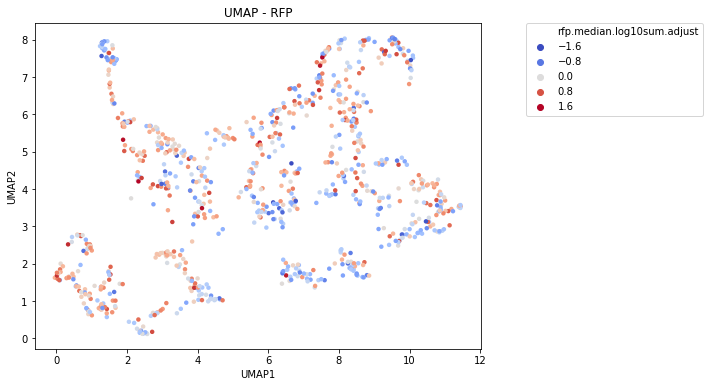

In [11]:
plt.figure(figsize=(8, 6))
            
sns.scatterplot(embedding[:,0], embedding[:,1], hue = labels["rfp.median.log10sum.adjust"], s = 20, linewidth=0, palette = "coolwarm", hue_norm=(-1,1))

plt.ylabel('UMAP2')
plt.xlabel('UMAP1')
plt.title('UMAP - RFP')
plt.legend(bbox_to_anchor=(1.1, 1),borderaxespad=0)
#plt.savefig('.png')
plt.show()

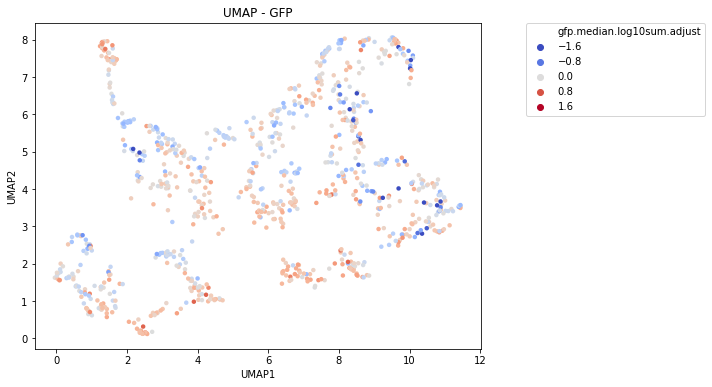

In [12]:
plt.figure(figsize=(8, 6))
            
sns.scatterplot(embedding[:,0], embedding[:,1], hue = labels["gfp.median.log10sum.adjust"], s = 20, linewidth=0, palette = "coolwarm", hue_norm=(-1,1))

plt.ylabel('UMAP2')
plt.xlabel('UMAP1')
plt.title('UMAP - GFP')
plt.legend(bbox_to_anchor=(1.1, 1),borderaxespad=0)
#plt.savefig('.png')
plt.show()

In [13]:
color_selection = custom_palette.loc["blue"]

(888, 20)
(888, 2)
(888, 3)


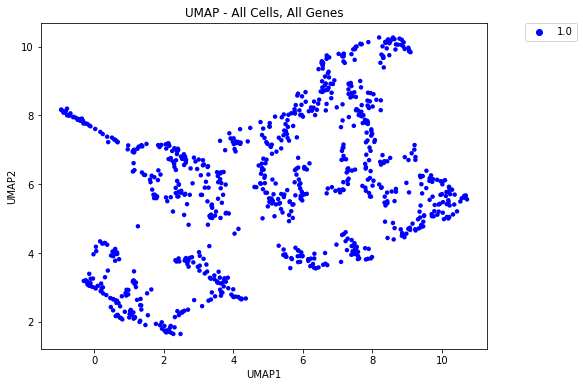

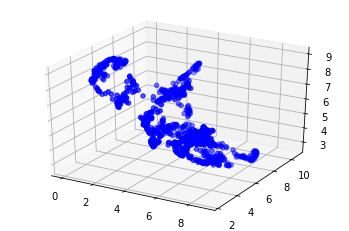

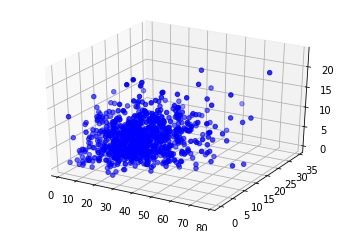

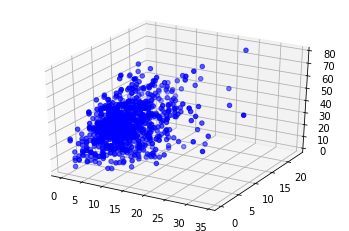

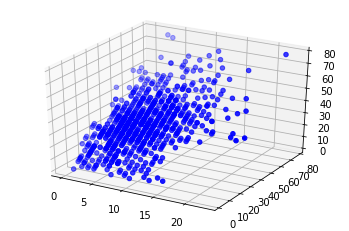

In [14]:
visualize(gene_expression.values, 20, 'UMAP - All Cells, All Genes', 0)

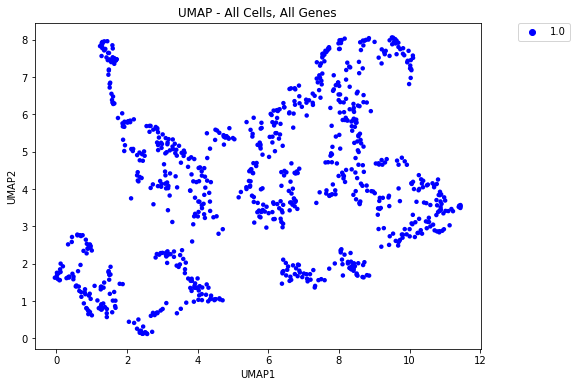

In [15]:
plt.figure(figsize=(8, 6))
            
sns.scatterplot(embedding[:,0], embedding[:,1], hue = np.ones(embedding.shape[0]), s = 20, linewidth=0, palette = [color_selection[0]])

plt.ylabel('UMAP2')
plt.xlabel('UMAP1')
plt.title('UMAP - All Cells, All Genes')
plt.legend(bbox_to_anchor=(1.2, 1),borderaxespad=0)
#plt.savefig('.png')
plt.show()

## Persistence Diagram

c:\users\hmkri\desktop\riesenfeld pearson\lib\site-packages\ripser\ripser.py:257: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


inf


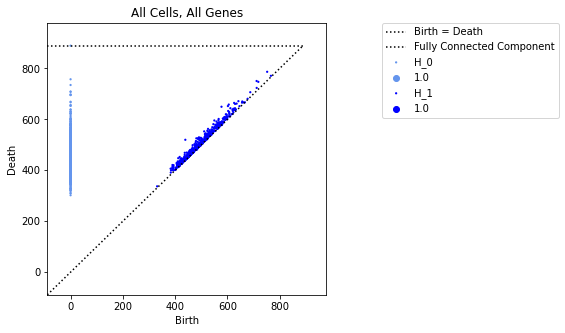

In [16]:
bd, color = persistance_diagram(gene_expression.values, "blue", "All Cells, All Genes")

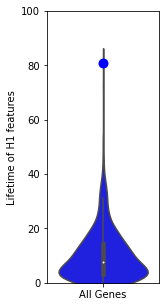

In [17]:
sublabel = ""

violin_lifetime(bd, 0, color, sublabel)

## Reduce data to cyclic genes

In [18]:
CDK1 = "ENSG00000170312"
UBE2C = "ENSG00000175063"
TOP2A = "ENSG00000131747"
#H4C5 = "ENSG00000276966"
H4C3 = "ENSG00000197061"

sublabel_cycle = "CDK1, UBE2C, H4C3"

In [19]:
gene_sub = gene_expression.loc[[CDK1, UBE2C, H4C3]]

In [20]:
gene_sub

,20170905-A01,20170905-A02,20170905-A03,20170905-A06,20170905-A07,20170905-A08,20170905-A09,20170905-A10,20170905-A11,20170905-A12,...,20170924-G05,20170924-G06,20170924-G07,20170924-G09,20170924-G12,20170924-H03,20170924-H05,20170924-H07,20170924-H08,20170924-H11
ENSG00000170312,1,1,6,37,28,12,2,5,2,10,...,8,7,25,5,7,5,17,13,19,6
ENSG00000175063,14,22,19,40,55,10,8,12,3,18,...,7,5,29,11,14,19,21,16,27,10
ENSG00000197061,157,52,182,108,214,222,92,131,79,163,...,107,122,307,106,80,170,335,227,170,90


In [21]:
gene_sub_values = gene_expression.loc[[CDK1, UBE2C, H4C3]].values
gene_sub_TOP2A_values = gene_expression.loc[[TOP2A]].values

gene_sub_values[1,:] = (gene_sub_values[1,:] + gene_sub_TOP2A_values)/2

In [22]:
gene_sub = pd.DataFrame(gene_sub_values, index = ["CDK1", "UBE2C, TOP2A", "H4C3"], columns = gene_expression.columns )

In [23]:
gene_sub

,20170905-A01,20170905-A02,20170905-A03,20170905-A06,20170905-A07,20170905-A08,20170905-A09,20170905-A10,20170905-A11,20170905-A12,...,20170924-G05,20170924-G06,20170924-G07,20170924-G09,20170924-G12,20170924-H03,20170924-H05,20170924-H07,20170924-H08,20170924-H11
CDK1,1,1,6,37,28,12,2,5,2,10,...,8,7,25,5,7,5,17,13,19,6
"UBE2C, TOP2A",11,17,16,39,59,16,7,20,4,16,...,7,10,27,13,13,17,32,18,20,10
H4C3,157,52,182,108,214,222,92,131,79,163,...,107,122,307,106,80,170,335,227,170,90


In [24]:
pca = PCA(n_components=3)
pca.fit(gene_sub.values.T)
X = pca.transform(gene_sub.values.T)
print(X.shape)
    
reducer = umap.UMAP(random_state=42, n_components=2)
embedding_sub = reducer.fit_transform(X)
print(embedding_sub.shape)

(888, 3)
(888, 2)


(888, 3)
(888, 2)
(888, 3)


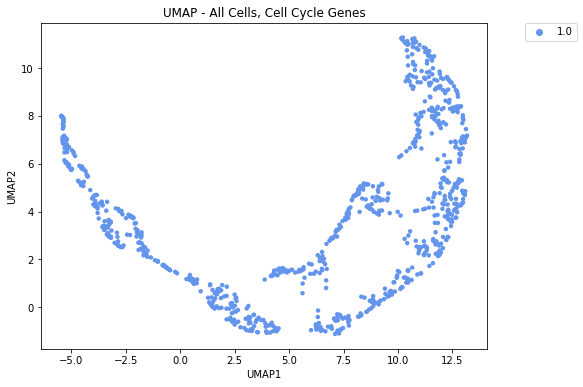

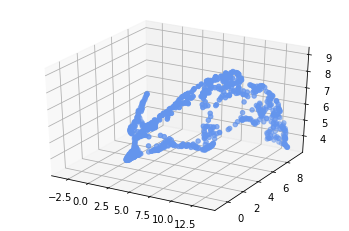

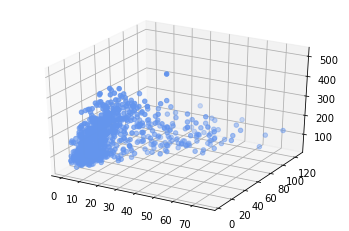

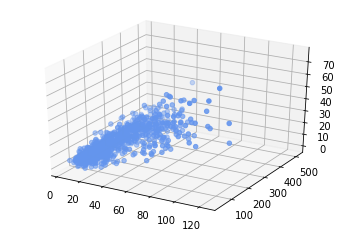

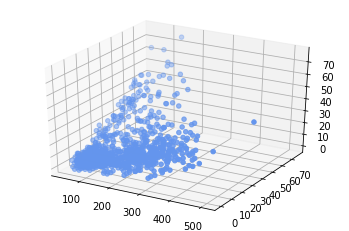

In [25]:
visualize(gene_sub.values, 3, 'UMAP - All Cells, Cell Cycle Genes', 1)

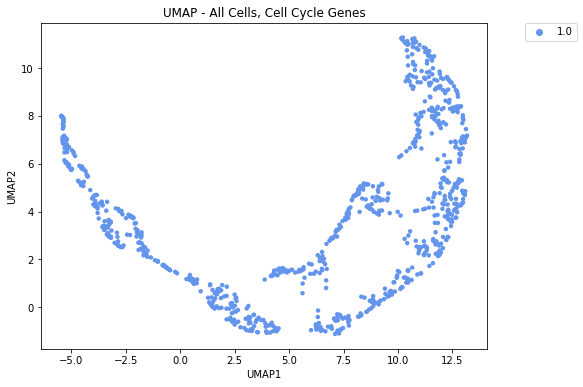

In [26]:
plt.figure(figsize=(8, 6))
            
sns.scatterplot(embedding_sub[:,0], embedding_sub[:,1], hue = np.ones(embedding_sub.shape[0]), s = 20, linewidth=0, palette = [color_selection[1]])
plt.ylabel('UMAP2')
plt.xlabel('UMAP1')
plt.title('UMAP - All Cells, Cell Cycle Genes')
plt.legend(bbox_to_anchor=(1.2, 1),borderaxespad=0)
#plt.savefig('.png')
plt.show()

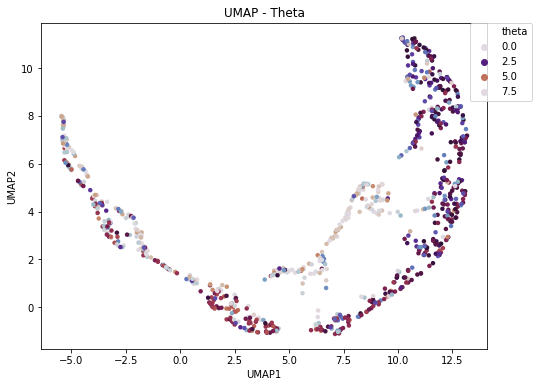

In [27]:
plt.figure(figsize=(8, 6))
            
sns.scatterplot(embedding_sub[:,0], embedding_sub[:,1], hue = labels["theta"], s = 20, linewidth=0, palette = "twilight", hue_norm = (0,2*3.1415))

plt.ylabel('UMAP2')
plt.xlabel('UMAP1')
plt.title('UMAP - Theta')
plt.legend(bbox_to_anchor=(1.1, 1),borderaxespad=0)
#plt.savefig('.png')
plt.show()

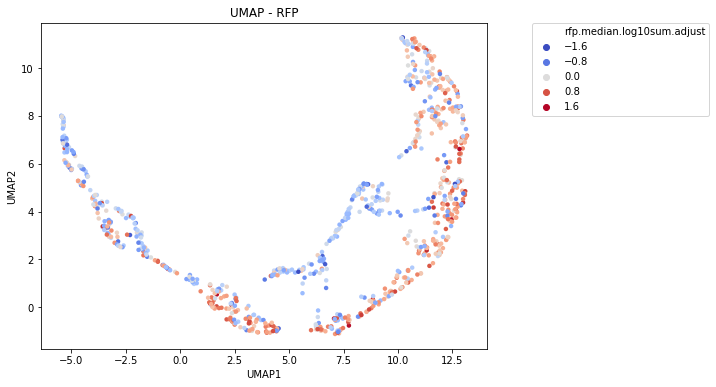

In [28]:
plt.figure(figsize=(8, 6))
            
sns.scatterplot(embedding_sub[:,0], embedding_sub[:,1], hue = labels["rfp.median.log10sum.adjust"], s = 20, linewidth=0, palette = "coolwarm", hue_norm=(-1,1))

plt.ylabel('UMAP2')
plt.xlabel('UMAP1')
plt.title('UMAP - RFP')
plt.legend(bbox_to_anchor=(1.1, 1),borderaxespad=0)
#plt.savefig('.png')
plt.show()

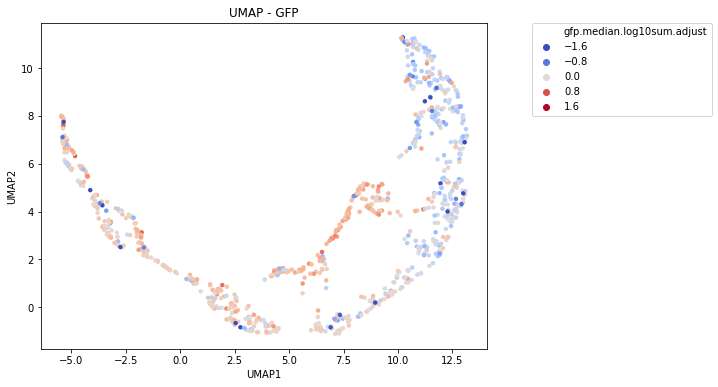

In [29]:
plt.figure(figsize=(8, 6))
            
sns.scatterplot(embedding_sub[:,0], embedding_sub[:,1], hue = labels["gfp.median.log10sum.adjust"], s = 20, linewidth=0, palette = "coolwarm", hue_norm=(-1,1))

plt.ylabel('UMAP2')
plt.xlabel('UMAP1')
plt.title('UMAP - GFP')
plt.legend(bbox_to_anchor=(1.1, 1),borderaxespad=0)
#plt.savefig('.png')
plt.show()

inf


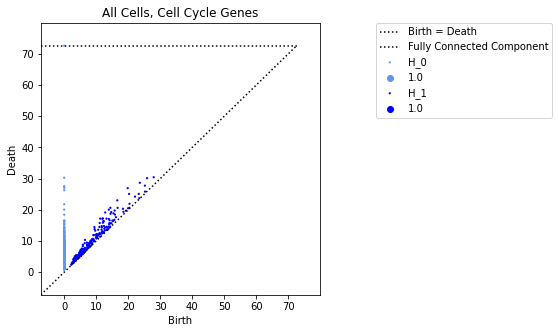

In [30]:
bd, color = persistance_diagram(gene_sub.values, "blue", "All Cells, Cell Cycle Genes")

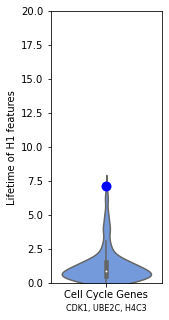

In [31]:
violin_lifetime(bd, 1, color, sublabel_cycle)

## Select 4 random genes

In [32]:
np.random.seed(0)
rand_gene_index = np.random.randint(0, 11093, size=3)
rand_gene = gene_expression.index[rand_gene_index]
print(rand_gene)

Index(['ENSG00000110934', 'ENSG00000232859', 'ENSG00000188092'], dtype='object')


In [33]:
gene_sub_rand1 = gene_expression.loc[rand_gene]

(888, 3)
(888, 2)
(888, 3)


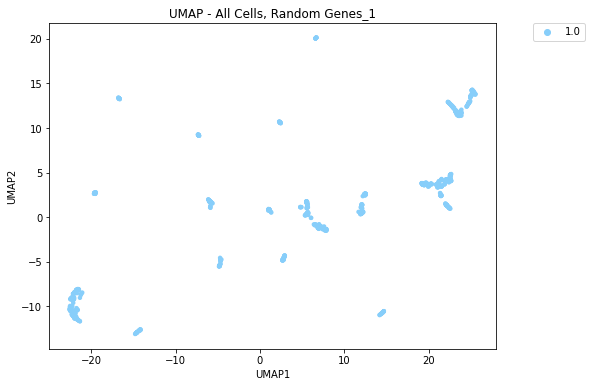

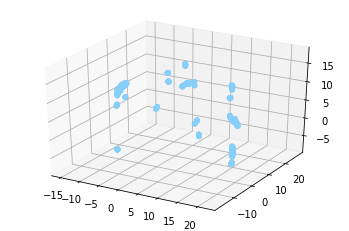

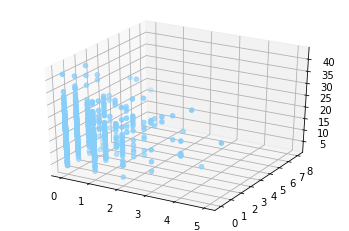

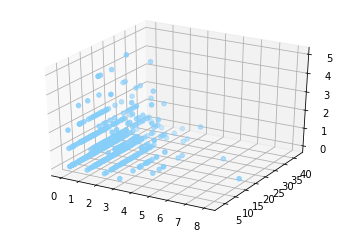

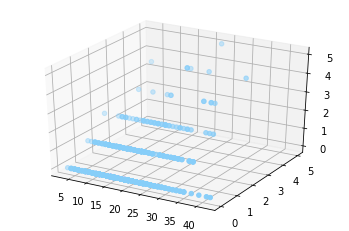

In [34]:
visualize(gene_sub_rand1.values, 3, 'UMAP - All Cells, Random Genes_1', 2)

inf


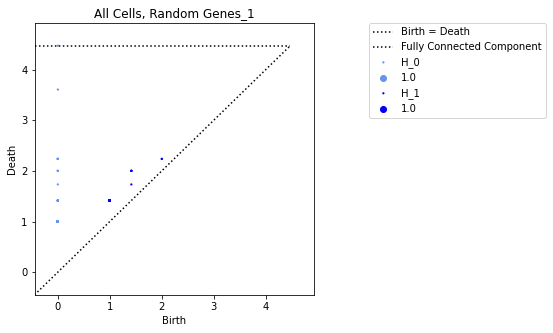

In [35]:
bd, color = persistance_diagram(gene_sub_rand1.values, "blue", "All Cells, Random Genes_1")

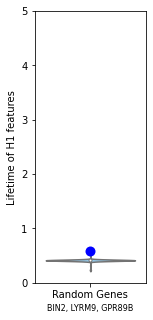

In [36]:
sublabel_1 = "BIN2, LYRM9, GPR89B"

violin_lifetime(bd, 2, color, sublabel_1)

## Select 4 random genes_2

In [37]:
np.random.seed(10)
rand_gene_index = np.random.randint(0, 11093, size=3)
rand_gene = gene_expression.index[rand_gene_index]
print(rand_gene)

Index(['ENSG00000087995', 'ENSG00000163449', 'ENSG00000089280'], dtype='object')


In [38]:
gene_sub_rand2 = gene_expression.loc[rand_gene]

(888, 3)
(888, 2)
(888, 3)


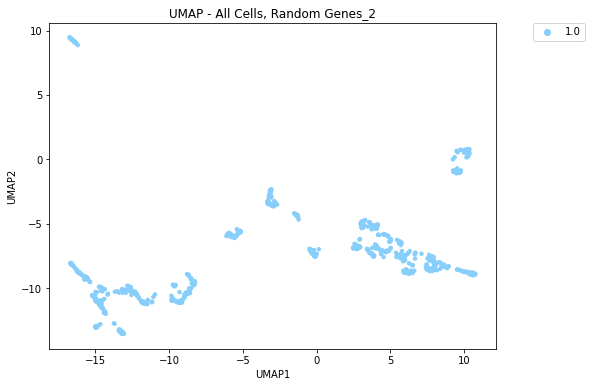

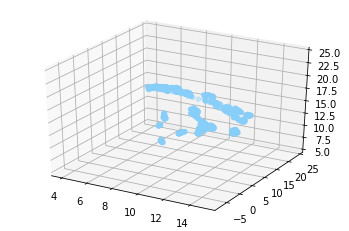

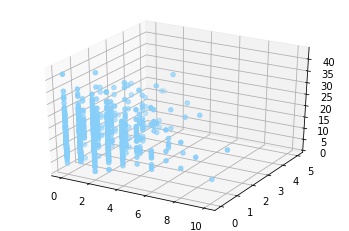

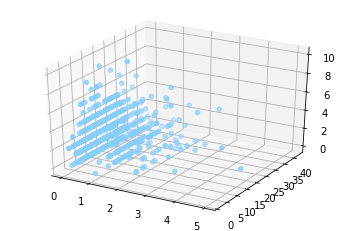

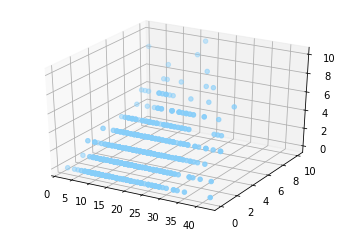

In [39]:
visualize(gene_sub_rand2.values, 3, 'UMAP - All Cells, Random Genes_2', 2)

inf


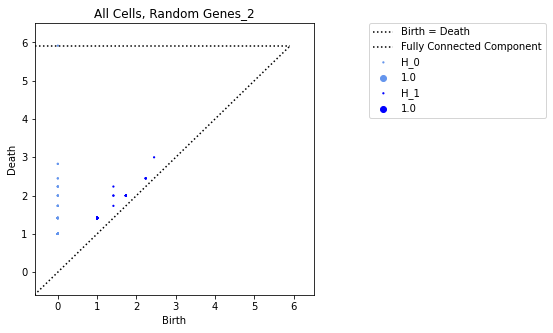

In [40]:
bd, color = persistance_diagram(gene_sub_rand2.values, "blue", "All Cells, Random Genes_2")

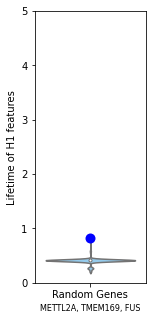

In [41]:
sublabel_2 = "METTL2A, TMEM169, FUS"

violin_lifetime(bd, 2, color, sublabel_2)

## Select 4 random genes_3

In [42]:
np.random.seed(20)
rand_gene_index = np.random.randint(0, 11093, size=3)
rand_gene = gene_expression.index[rand_gene_index]
print(rand_gene)

Index(['ENSG00000215301', 'ENSG00000130764', 'ENSG00000163902'], dtype='object')


In [43]:
gene_sub_rand3 = gene_expression.loc[rand_gene]

(888, 3)
(888, 2)
(888, 3)


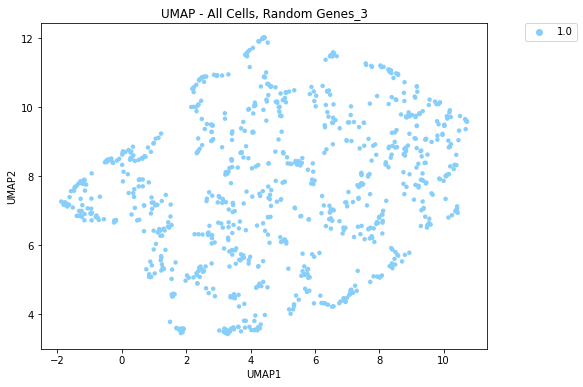

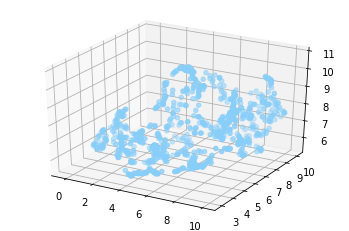

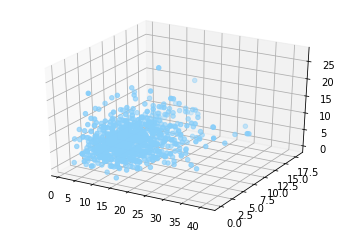

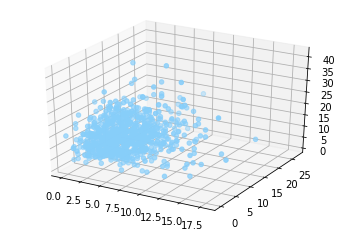

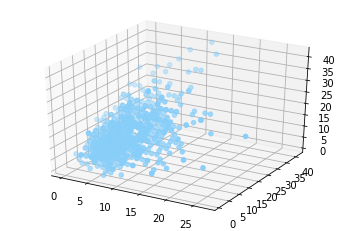

In [44]:
visualize(gene_sub_rand3.values, 3, 'UMAP - All Cells, Random Genes_3', 2)

inf


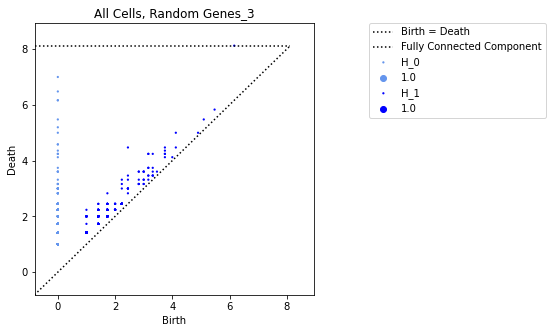

In [45]:
bd, color = persistance_diagram(gene_sub_rand3.values, "blue", "All Cells, Random Genes_3")

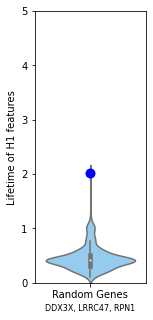

In [46]:
sublabel_3 = "DDX3X, LRRC47, RPN1"

violin_lifetime(bd, 2, color, sublabel_3)

## Select 4 random genes_4

In [47]:
np.random.seed(30)
rand_gene_index = np.random.randint(0, 11093, size=3)
rand_gene = gene_expression.index[rand_gene_index]
print(rand_gene)

Index(['ENSG00000145536', 'ENSG00000132305', 'ENSG00000052723'], dtype='object')


In [48]:
gene_sub_rand4 = gene_expression.loc[rand_gene]

(888, 3)
(888, 2)
(888, 3)


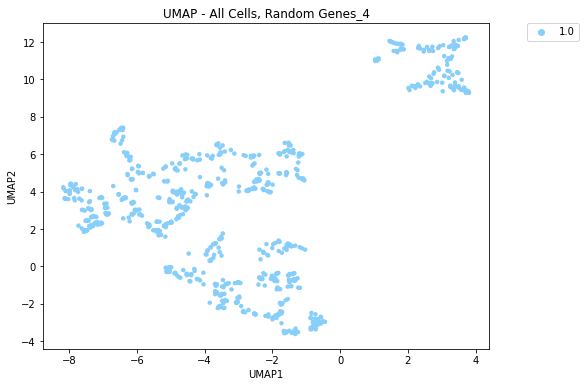

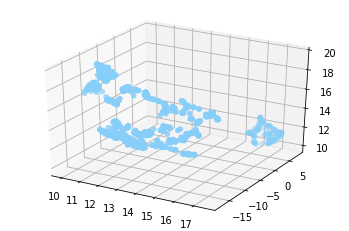

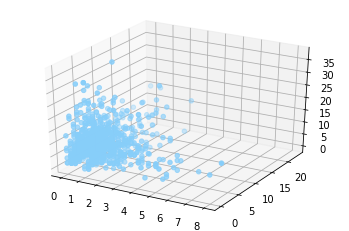

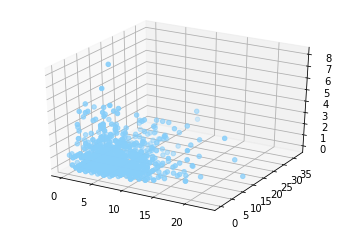

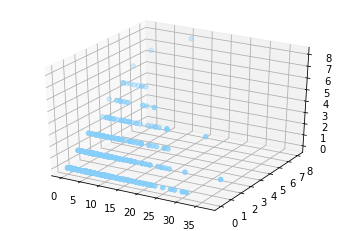

In [49]:
visualize(gene_sub_rand4.values, 3, 'UMAP - All Cells, Random Genes_4', 2)

inf


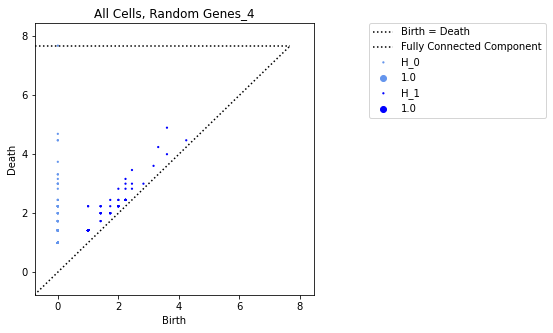

In [50]:
bd, color = persistance_diagram(gene_sub_rand4.values, "blue", "All Cells, Random Genes_4")

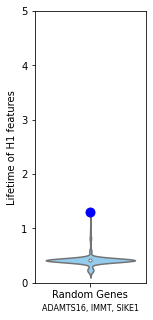

In [51]:
sublabel_4 = "ADAMTS16, IMMT, SIKE1"

violin_lifetime(bd, 2, color, sublabel_4)

## Select 4 random genes_5

In [52]:
np.random.seed(40)
rand_gene_index = np.random.randint(0, 11093, size=3)
rand_gene = gene_expression.index[rand_gene_index]
print(rand_gene)

Index(['ENSG00000165233', 'ENSG00000140391', 'ENSG00000145901'], dtype='object')


In [53]:
gene_sub_rand5 = gene_expression.loc[rand_gene]

(888, 3)
(888, 2)
(888, 3)


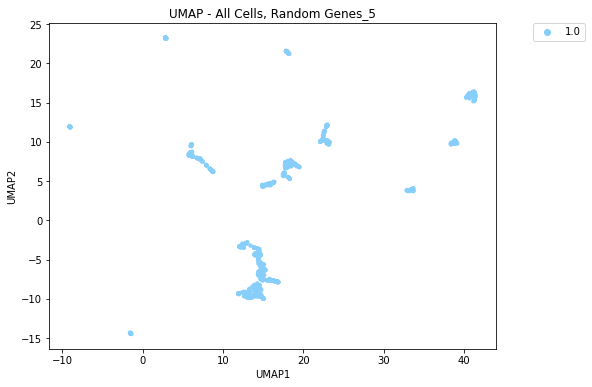

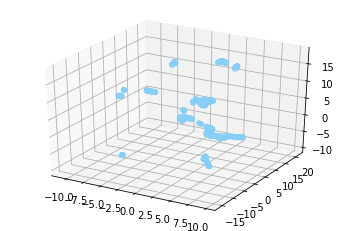

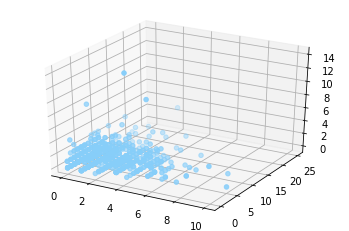

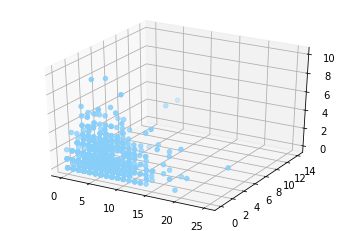

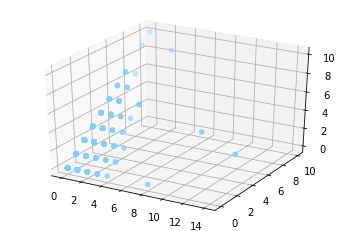

In [54]:
visualize(gene_sub_rand5.values, 3, 'UMAP - All Cells, Random Genes_5', 2)

inf


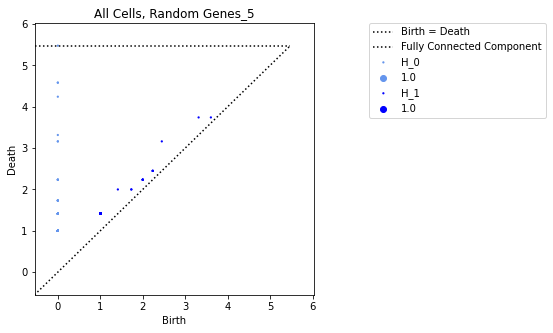

In [55]:
bd, color = persistance_diagram(gene_sub_rand5.values, "blue", "All Cells, Random Genes_5")

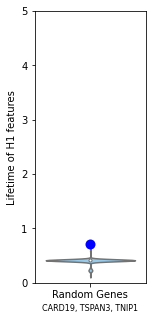

In [56]:
sublabel_5 = "CARD19, TSPAN3, TNIP1"

violin_lifetime(bd, 2, color, sublabel_5)

## Cut cycle from UMAP

In [57]:
color_selection = custom_palette.loc["green"]

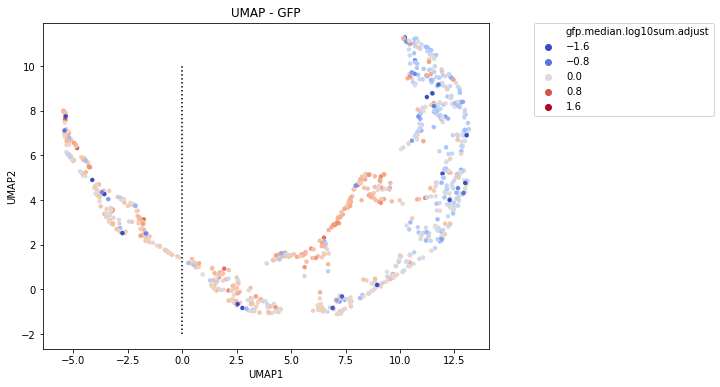

In [58]:
plt.figure(figsize=(8, 6))
            
sns.scatterplot(embedding_sub[:,0], embedding_sub[:,1], hue = labels["gfp.median.log10sum.adjust"], s = 20, linewidth=0, palette = "coolwarm", hue_norm=(-1,1))
plt.vlines(0, -2, 10, linestyles ="dotted", colors ="k")
plt.ylabel('UMAP2')
plt.xlabel('UMAP1')
plt.title('UMAP - GFP')
plt.legend(bbox_to_anchor=(1.1, 1),borderaxespad=0)
#plt.savefig('.png')
plt.show()

In [59]:
location_include = np.where(embedding_sub[:,0] > 0)[0]
print(location_include.shape)

name_include = []
embedding_include_x = []
embedding_include_y = []

for i in range(location_include.shape[0]):
    name_include.append(gene_expression.columns[location_include[i]])  
    embedding_include_x.append(embedding_sub[location_include[i],0]) 
    embedding_include_y.append(embedding_sub[location_include[i],1]) 
    
include_gene_expression = gene_expression[name_include]
embedding_include_x = np.array(embedding_include_x)
embedding_include_y = np.array(embedding_include_y)
embedding_include_x = np.reshape(embedding_include_x, (embedding_include_x.shape[0],1))
embedding_include_y = np.reshape(embedding_include_y, (embedding_include_x.shape[0],1))

embedding_include = np.append(embedding_include_x, embedding_include_y, axis = 1)

(700,)


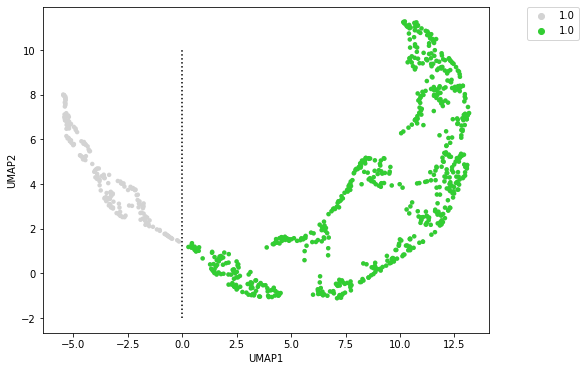

In [60]:
plt.figure(figsize=(8, 6))
            
sns.scatterplot(embedding_sub[:,0], embedding_sub[:,1], hue = np.ones(embedding_sub.shape[0]), s = 20, linewidth=0, palette = ["lightgrey"])
sns.scatterplot(embedding_include[:,0], embedding_include[:,1], hue = np.ones(embedding_include.shape[0]), s = 20, linewidth=0, palette = [color_selection[1]])
plt.vlines(0, -2, 10, linestyles ="dotted", colors ="k")
plt.ylabel('UMAP2')
plt.xlabel('UMAP1')
plt.legend(bbox_to_anchor=(1.2, 1),borderaxespad=0)
#plt.savefig('.png')
plt.show()

(700, 20)
(700, 2)
(700, 3)


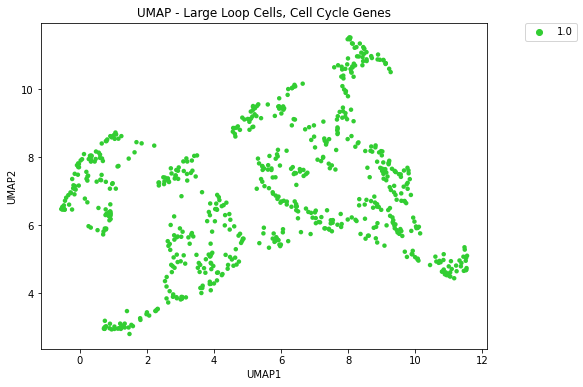

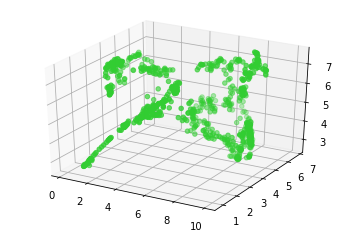

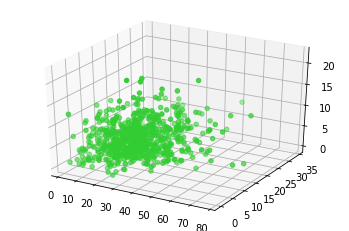

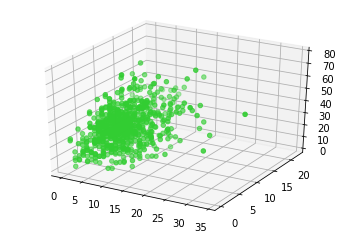

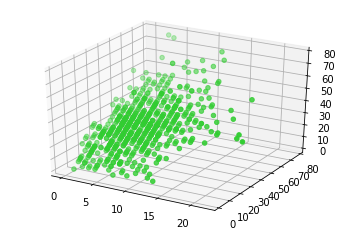

In [61]:
visualize(include_gene_expression.values, 20, 'UMAP - Large Loop Cells, Cell Cycle Genes', 1)

c:\users\hmkri\desktop\riesenfeld pearson\lib\site-packages\ripser\ripser.py:257: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


inf


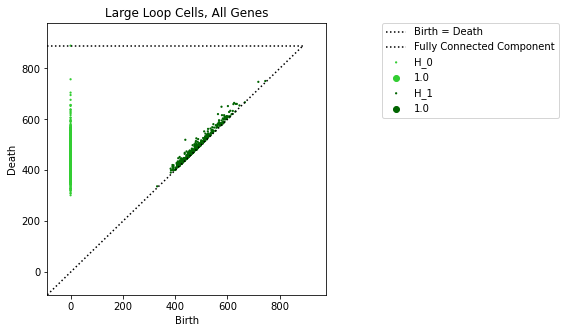

In [62]:
bd, color = persistance_diagram(include_gene_expression.values, "green", "Large Loop Cells, All Genes")

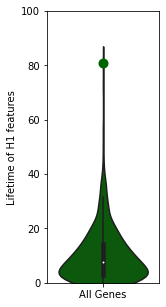

In [63]:
violin_lifetime(bd, 0, color, sublabel)

In [64]:
include_gene_expression = gene_sub[name_include]

(700, 3)
(700, 2)
(700, 3)


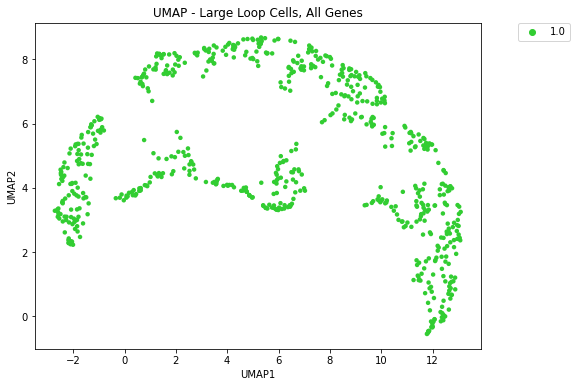

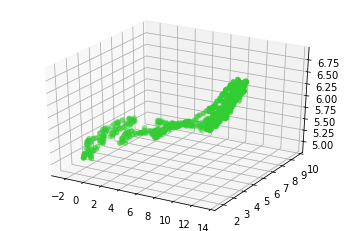

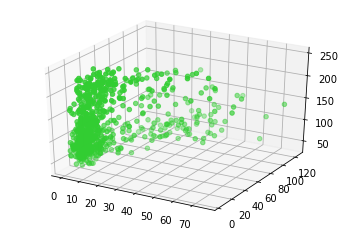

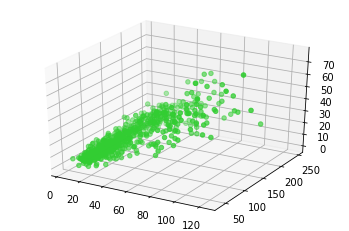

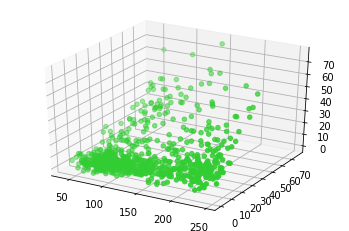

In [65]:
visualize(include_gene_expression.values, 3, 'UMAP - Large Loop Cells, All Genes', 1)

inf


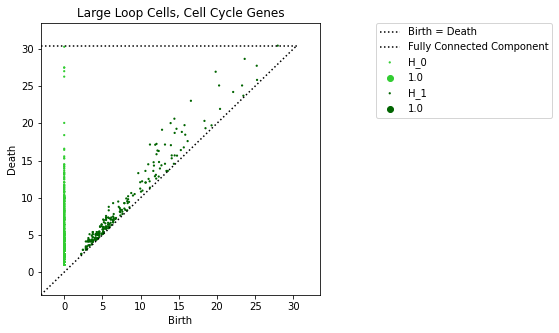

In [66]:
bd, color = persistance_diagram(include_gene_expression.values, "green", "Large Loop Cells, Cell Cycle Genes")

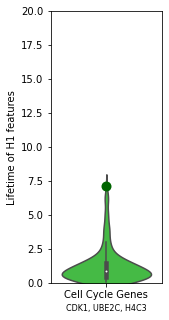

In [67]:
violin_lifetime(bd, 1, color, sublabel_cycle)

In [68]:
include_gene_expression = gene_sub_rand1[name_include]

(700, 3)
(700, 2)
(700, 3)


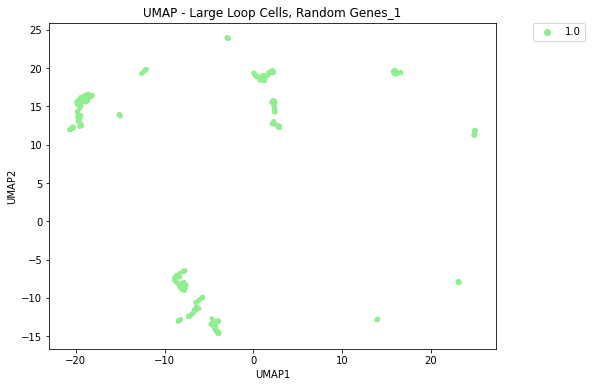

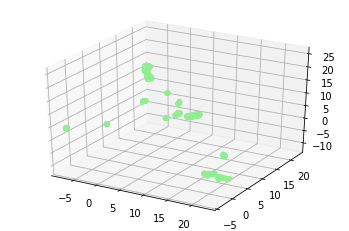

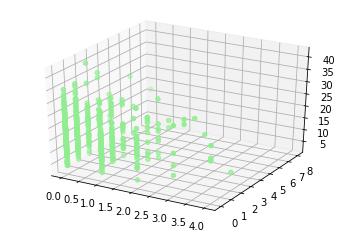

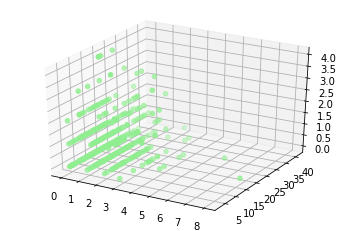

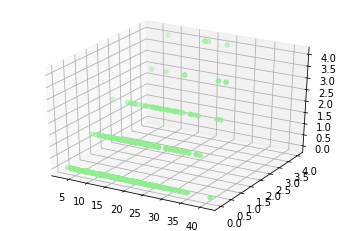

In [69]:
visualize(include_gene_expression.values, 3, 'UMAP - Large Loop Cells, Random Genes_1', 2)

inf


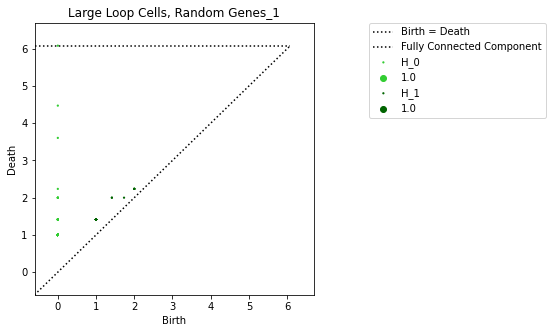

In [70]:
bd, color = persistance_diagram(include_gene_expression.values, "green", "Large Loop Cells, Random Genes_1")

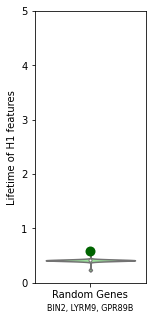

In [71]:
violin_lifetime(bd, 2, color, sublabel_1)

In [72]:
include_gene_expression = gene_sub_rand2[name_include]

(700, 3)
(700, 2)
(700, 3)


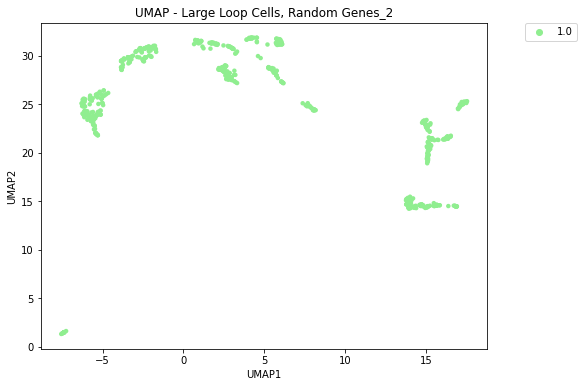

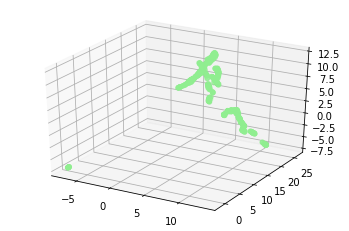

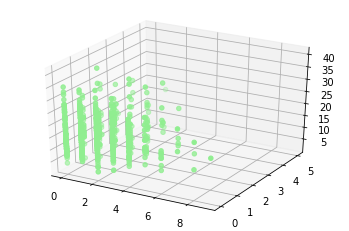

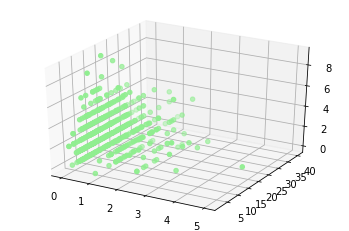

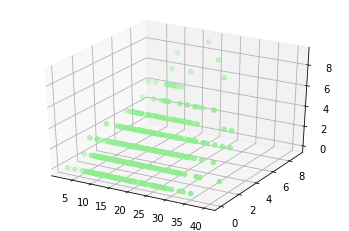

In [73]:
visualize(include_gene_expression.values, 3, 'UMAP - Large Loop Cells, Random Genes_2', 2)

inf


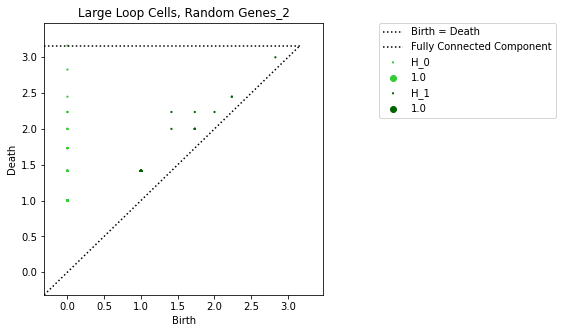

In [74]:
bd, color = persistance_diagram(include_gene_expression.values, "green", "Large Loop Cells, Random Genes_2")

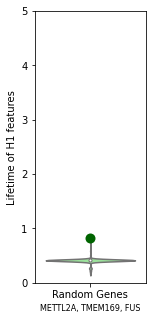

In [75]:
violin_lifetime(bd, 2, color, sublabel_2)

In [76]:
include_gene_expression = gene_sub_rand3[name_include]

(700, 3)
(700, 2)
(700, 3)


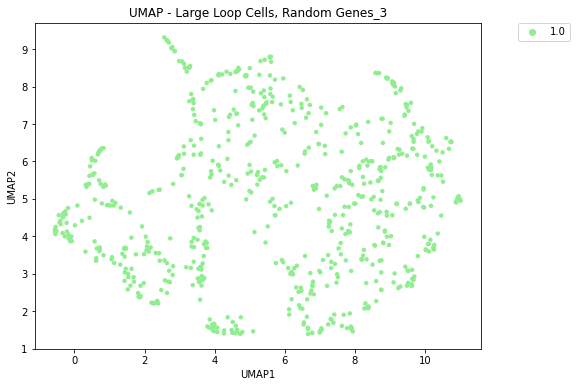

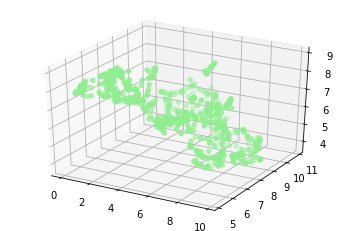

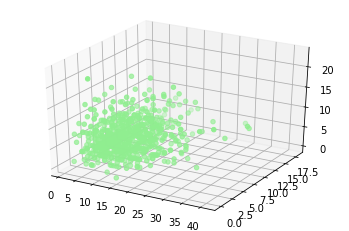

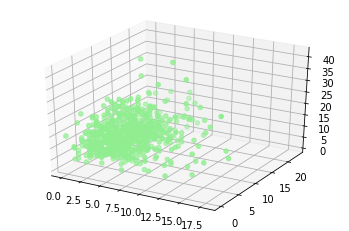

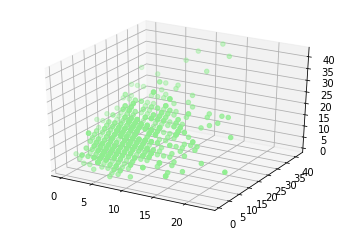

In [77]:
visualize(include_gene_expression.values, 3, 'UMAP - Large Loop Cells, Random Genes_3', 2)

inf


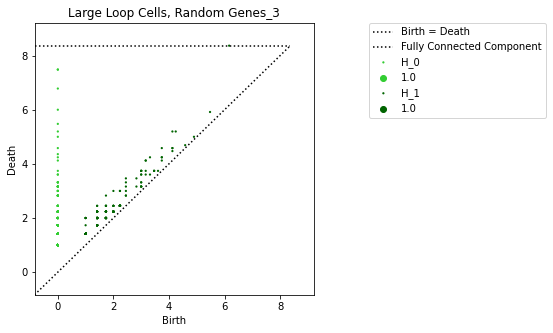

In [78]:
bd, color = persistance_diagram(include_gene_expression.values, "green", "Large Loop Cells, Random Genes_3")

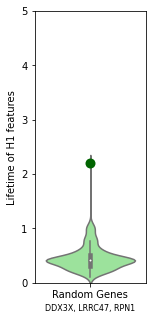

In [79]:
violin_lifetime(bd, 2, color, sublabel_3)

In [80]:
include_gene_expression = gene_sub_rand4[name_include]

(700, 3)
(700, 2)
(700, 3)


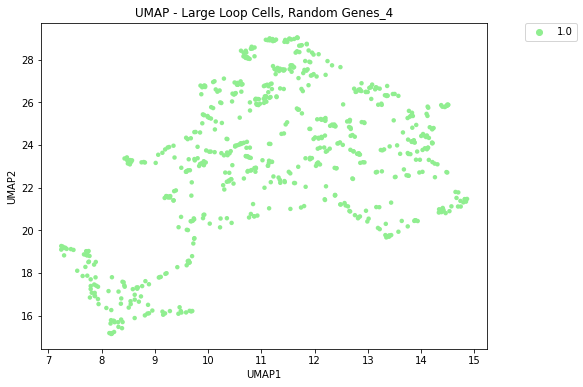

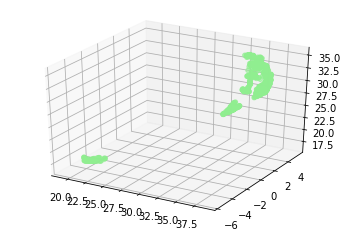

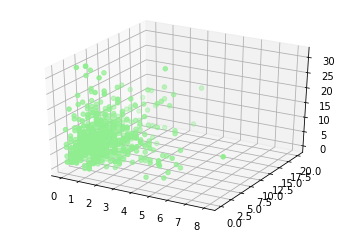

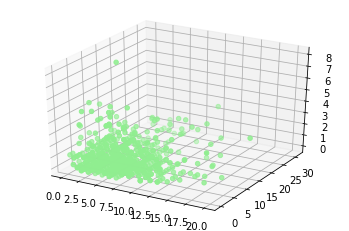

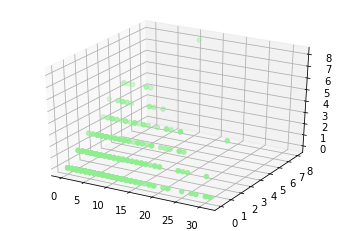

In [81]:
visualize(include_gene_expression.values, 3, 'UMAP - Large Loop Cells, Random Genes_4', 2)

inf


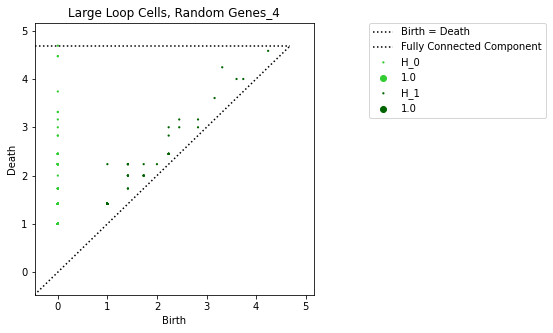

In [82]:
bd, color = persistance_diagram(include_gene_expression.values, "green", "Large Loop Cells, Random Genes_4")

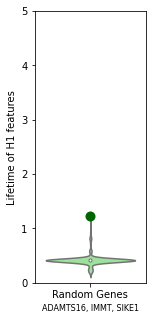

In [83]:
violin_lifetime(bd, 2, color, sublabel_4)

In [84]:
include_gene_expression = gene_sub_rand5[name_include]

(700, 3)
(700, 2)
(700, 3)


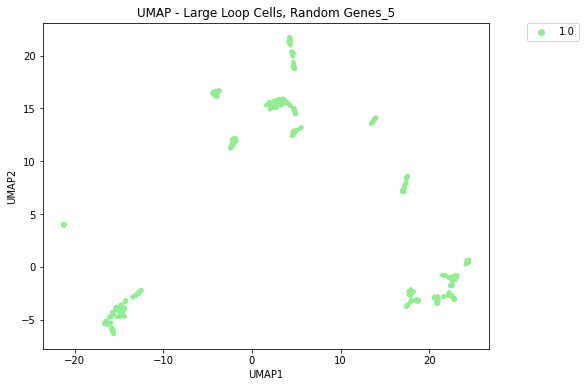

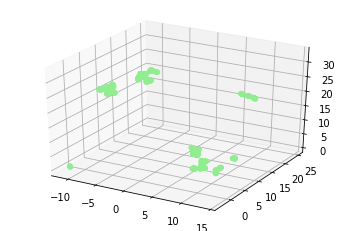

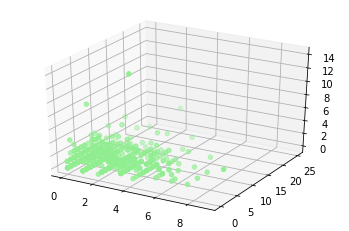

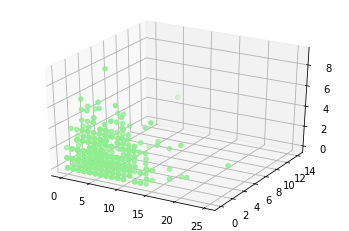

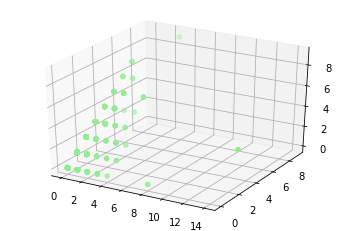

In [85]:
visualize(include_gene_expression.values, 3, 'UMAP - Large Loop Cells, Random Genes_5', 2)

inf


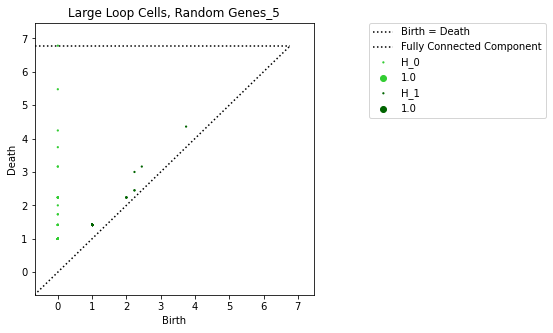

In [86]:
bd, color = persistance_diagram(include_gene_expression.values, "green", "Large Loop Cells, Random Genes_5")

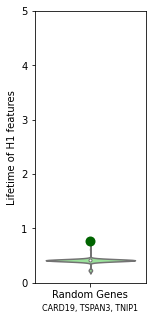

In [87]:
violin_lifetime(bd, 2, color, sublabel_5)

## Cut cycle from UMAP

In [88]:
color_selection = custom_palette.loc["orange"]

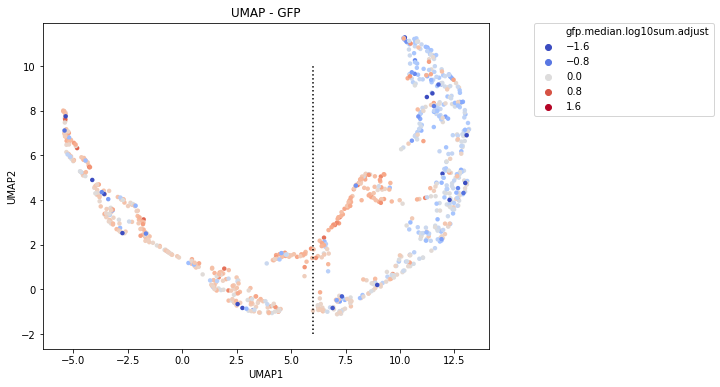

In [89]:
plt.figure(figsize=(8, 6))
            
sns.scatterplot(embedding_sub[:,0], embedding_sub[:,1], hue = labels["gfp.median.log10sum.adjust"], s = 20, linewidth=0, palette = "coolwarm", hue_norm=(-1,1))
plt.vlines(6, -2, 10, linestyles ="dotted", colors ="k")
plt.ylabel('UMAP2')
plt.xlabel('UMAP1')
plt.title('UMAP - GFP')
plt.legend(bbox_to_anchor=(1.1, 1),borderaxespad=0)
#plt.savefig('.png')
plt.show()

In [90]:
location_include = np.where(embedding_sub[:,0] < 6)[0]
print(location_include.shape)

name_include = []
embedding_include_x = []
embedding_include_y = []

for i in range(location_include.shape[0]):
    name_include.append(gene_expression.columns[location_include[i]])  
    embedding_include_x.append(embedding_sub[location_include[i],0]) 
    embedding_include_y.append(embedding_sub[location_include[i],1]) 
    
include_gene_expression = gene_expression[name_include]
embedding_include_x = np.array(embedding_include_x)
embedding_include_y = np.array(embedding_include_y)
embedding_include_x = np.reshape(embedding_include_x, (embedding_include_x.shape[0],1))
embedding_include_y = np.reshape(embedding_include_y, (embedding_include_x.shape[0],1))

embedding_include = np.append(embedding_include_x, embedding_include_y, axis = 1)

(342,)


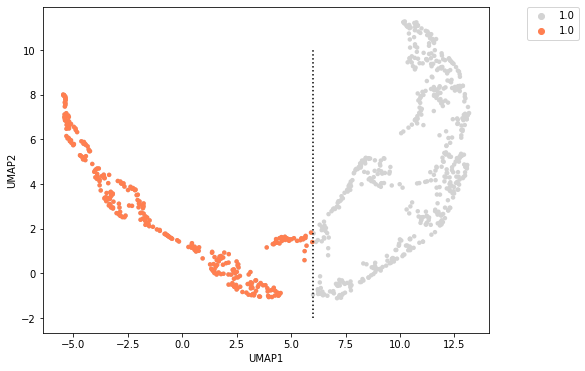

In [91]:
plt.figure(figsize=(8, 6))
            
sns.scatterplot(embedding_sub[:,0], embedding_sub[:,1], hue = np.ones(embedding_sub.shape[0]), s = 20, linewidth=0, palette = ["lightgrey"])
sns.scatterplot(embedding_include[:,0], embedding_include[:,1], hue = np.ones(embedding_include.shape[0]), s = 20, linewidth=0, palette = [color_selection[1]])
plt.vlines(6, -2, 10, linestyles ="dotted", colors ="k")
plt.ylabel('UMAP2')
plt.xlabel('UMAP1')

plt.legend(bbox_to_anchor=(1.2, 1),borderaxespad=0)
#plt.savefig('.png')
plt.show()

(342, 3)
(342, 2)
(342, 3)


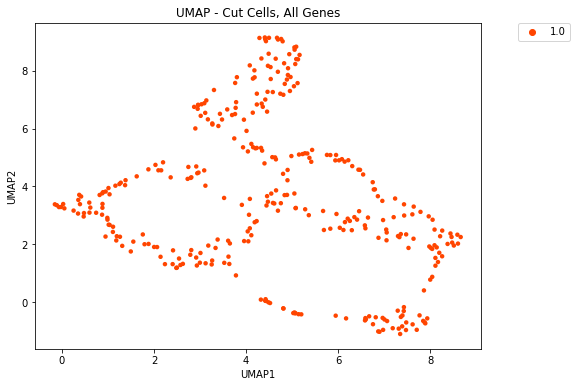

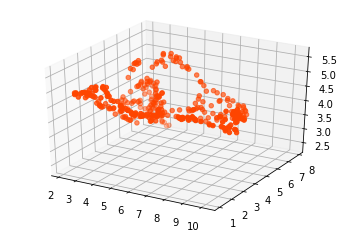

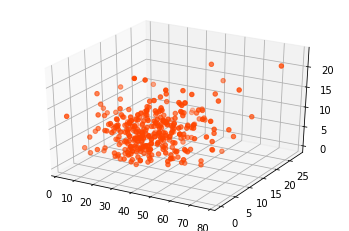

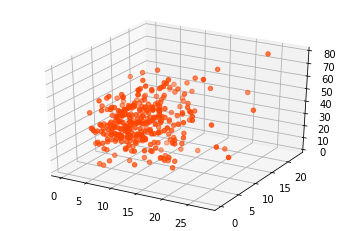

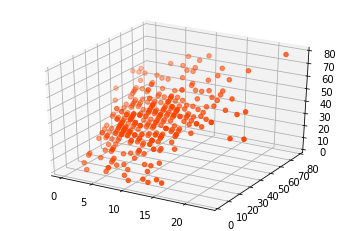

In [92]:
visualize(include_gene_expression.values, 3, 'UMAP - Cut Cells, All Genes', 0)

inf


c:\users\hmkri\desktop\riesenfeld pearson\lib\site-packages\ripser\ripser.py:257: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


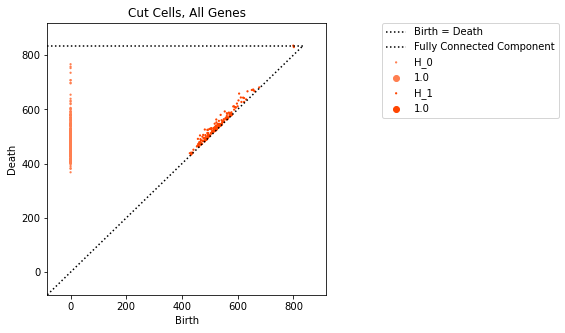

In [93]:
bd, color = persistance_diagram(include_gene_expression.values, "orange", "Cut Cells, All Genes")

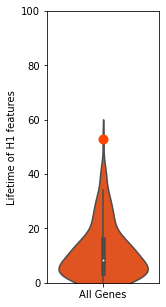

In [94]:
violin_lifetime(bd, 0, color, sublabel)

In [95]:
include_gene_expression = gene_sub[name_include]

(342, 3)
(342, 2)
(342, 3)


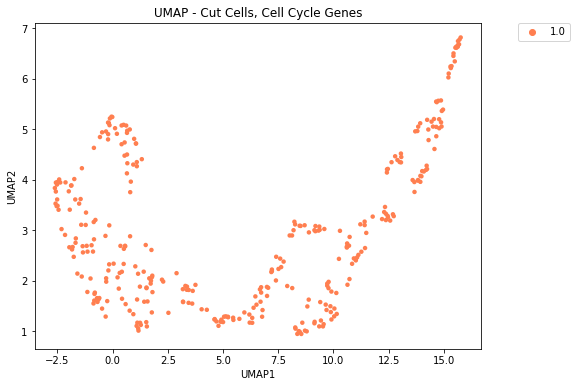

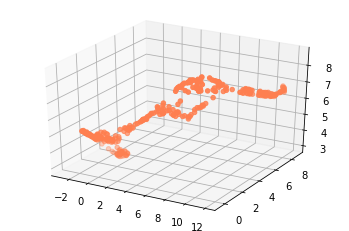

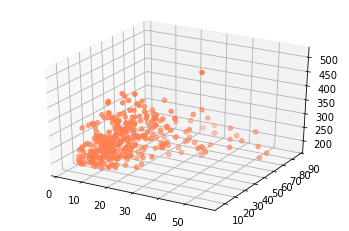

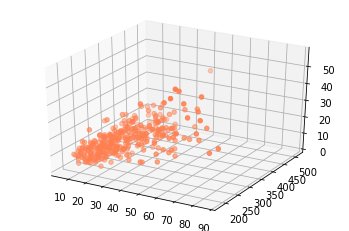

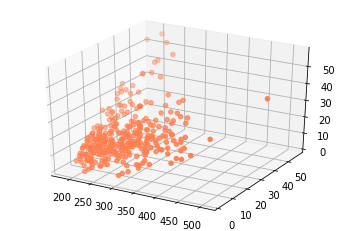

In [96]:
visualize(include_gene_expression.values, 3, 'UMAP - Cut Cells, Cell Cycle Genes', 1)

inf


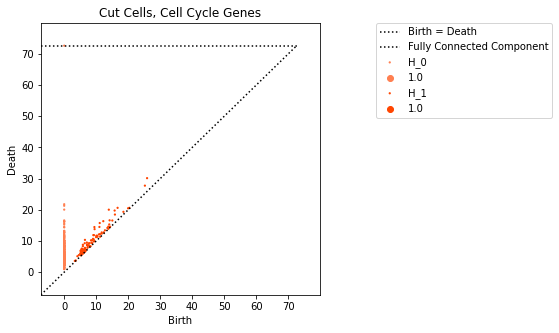

In [97]:
bd, color = persistance_diagram(include_gene_expression.values, "orange", "Cut Cells, Cell Cycle Genes")

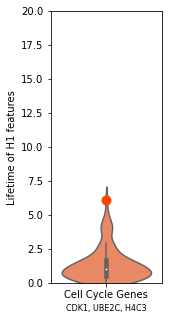

In [98]:
violin_lifetime(bd, 1, color, sublabel_cycle)

In [99]:
include_gene_expression = gene_sub_rand1[name_include]

(342, 3)
(342, 2)
(342, 3)


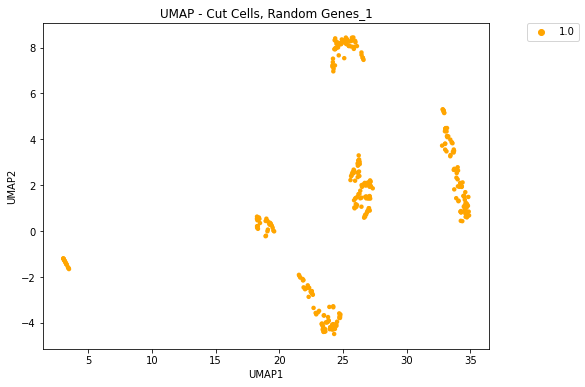

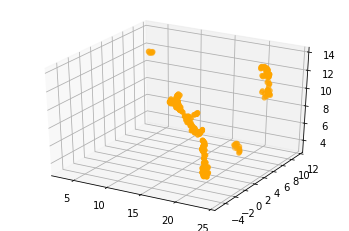

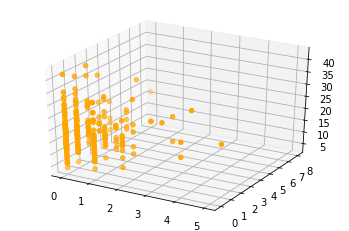

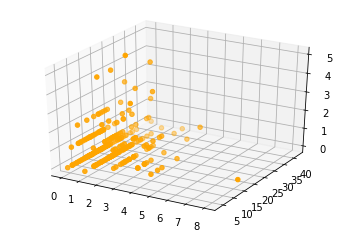

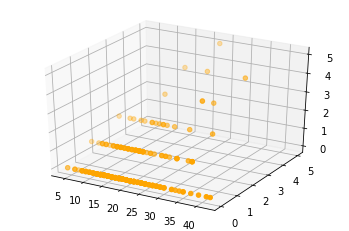

In [100]:
visualize(include_gene_expression.values, 3, 'UMAP - Cut Cells, Random Genes_1', 2)

inf


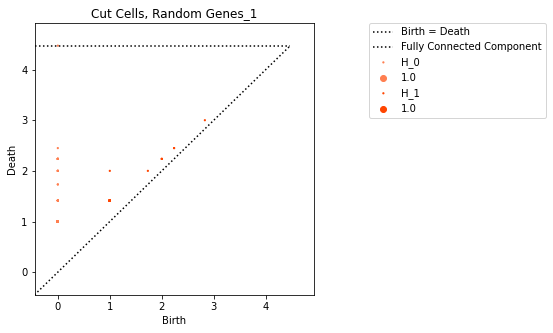

In [101]:
bd, color = persistance_diagram(include_gene_expression.values, "orange", "Cut Cells, Random Genes_1")

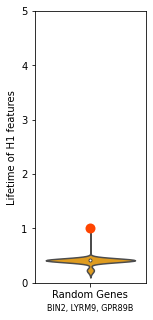

In [102]:
violin_lifetime(bd, 2, color, sublabel_1)

In [103]:
include_gene_expression = gene_sub_rand2[name_include]

(342, 3)
(342, 2)
(342, 3)


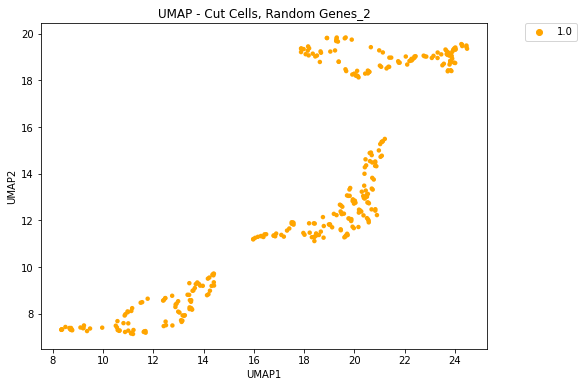

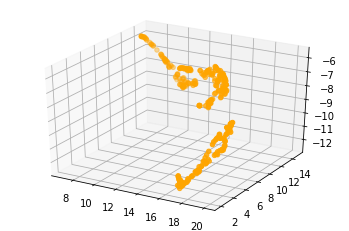

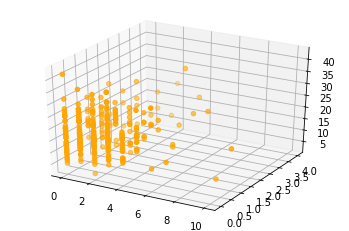

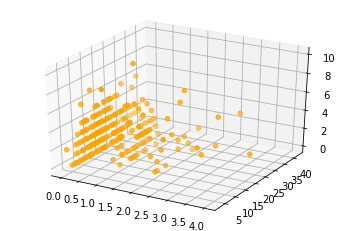

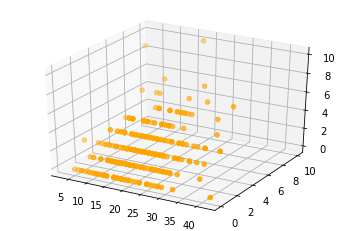

In [104]:
visualize(include_gene_expression.values, 3, 'UMAP - Cut Cells, Random Genes_2', 2)

inf


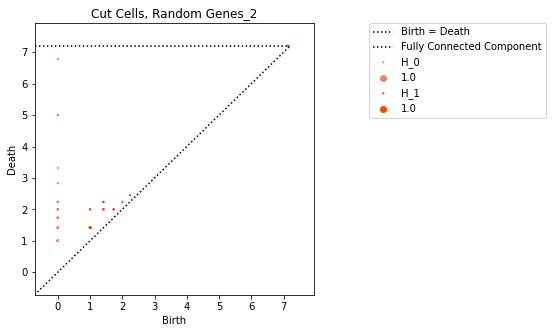

In [105]:
bd, color = persistance_diagram(include_gene_expression.values, "orange", "Cut Cells, Random Genes_2")

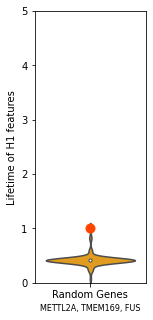

In [106]:
violin_lifetime(bd, 2, color, sublabel_2)

In [107]:
include_gene_expression = gene_sub_rand3[name_include]

(342, 3)
(342, 2)
(342, 3)


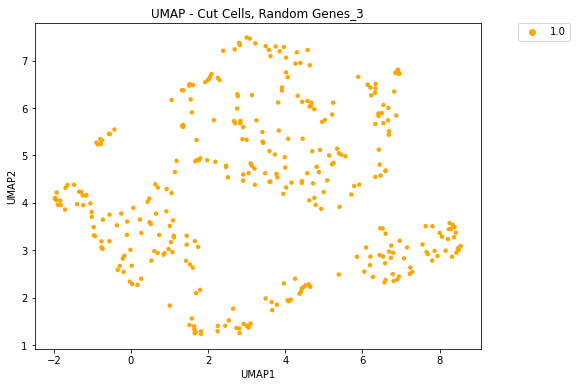

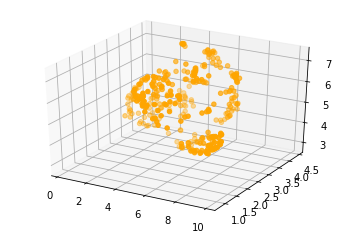

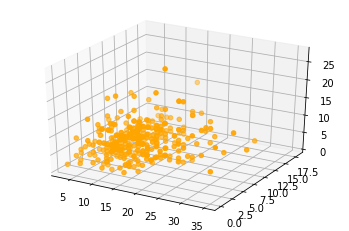

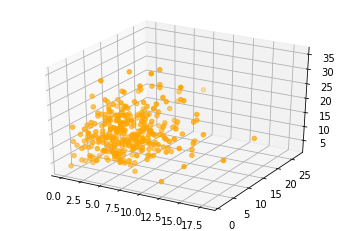

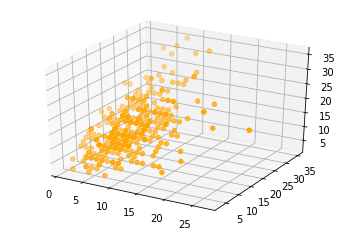

In [108]:
visualize(include_gene_expression.values, 3, 'UMAP - Cut Cells, Random Genes_3', 2)

inf


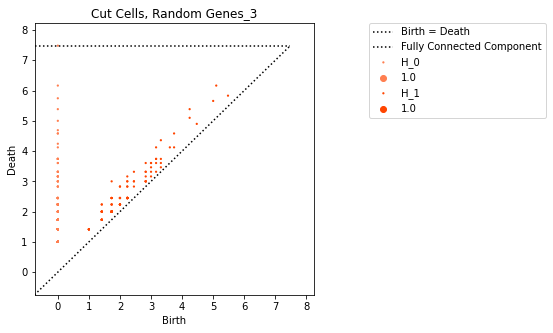

In [109]:
bd, color = persistance_diagram(include_gene_expression.values, "orange", "Cut Cells, Random Genes_3")

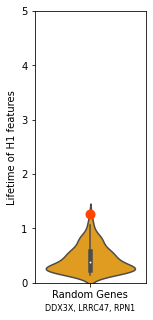

In [110]:
violin_lifetime(bd, 2, color, sublabel_3)

In [111]:
include_gene_expression = gene_sub_rand4[name_include]

(342, 3)
(342, 2)
(342, 3)


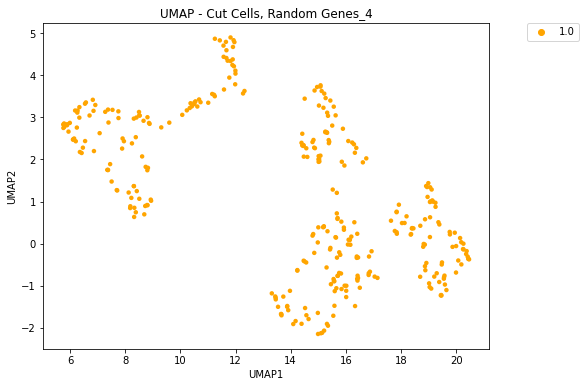

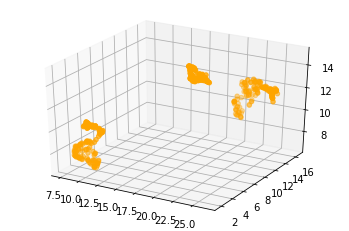

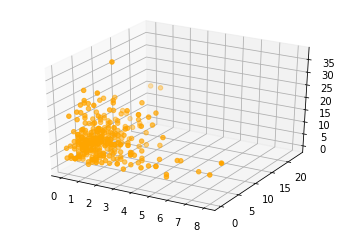

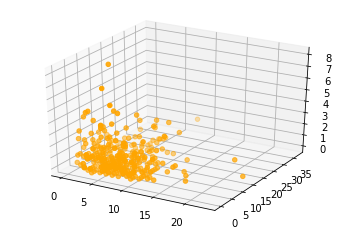

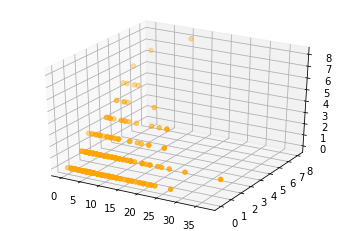

In [112]:
visualize(include_gene_expression.values, 3, 'UMAP - Cut Cells, Random Genes_4', 2)

inf


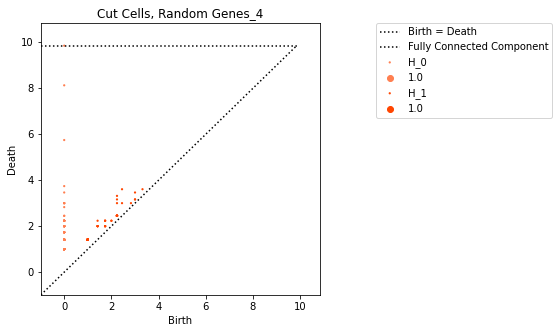

In [113]:
bd, color = persistance_diagram(include_gene_expression.values, "orange", "Cut Cells, Random Genes_4")

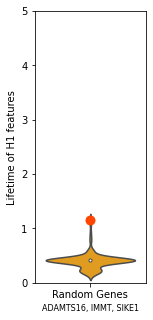

In [114]:
violin_lifetime(bd, 2, color, sublabel_4)

In [115]:
include_gene_expression = gene_sub_rand5[name_include]

(342, 3)
(342, 2)
(342, 3)


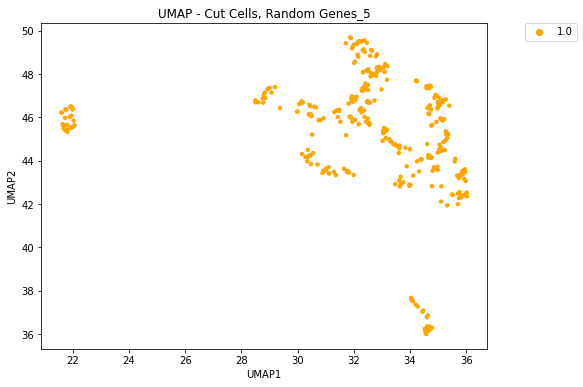

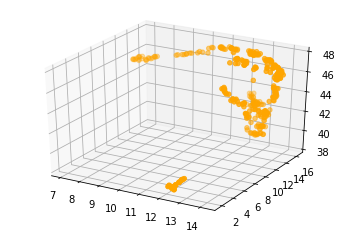

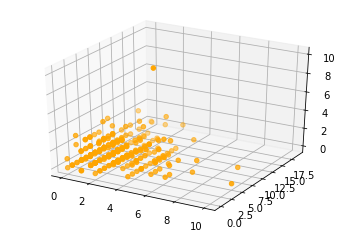

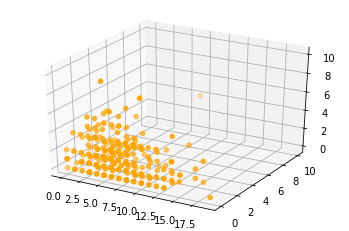

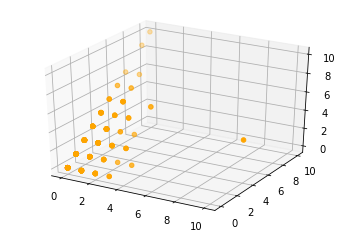

In [116]:
visualize(include_gene_expression.values, 3, 'UMAP - Cut Cells, Random Genes_5', 2)

inf


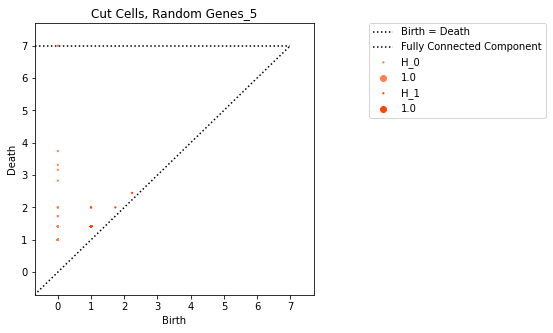

In [117]:
bd, color = persistance_diagram(include_gene_expression.values, "orange", "Cut Cells, Random Genes_5")

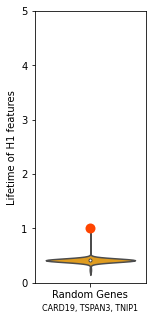

In [118]:
violin_lifetime(bd, 2, color, sublabel_5)

## Cut cycle from UMAP

In [119]:
color_selection = custom_palette.loc["red"]

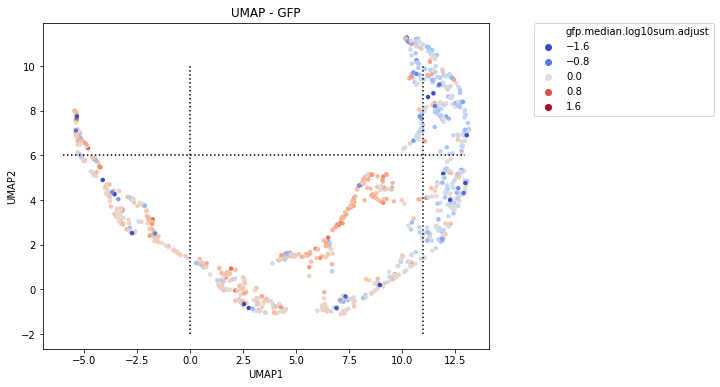

In [120]:
plt.figure(figsize=(8, 6))
            
sns.scatterplot(embedding_sub[:,0], embedding_sub[:,1], hue = labels["gfp.median.log10sum.adjust"], s = 20, linewidth=0, palette = "coolwarm", hue_norm=(-1,1))
plt.vlines(0, -2, 10, linestyles ="dotted", colors ="k")
plt.vlines(11, -2, 10, linestyles ="dotted", colors ="k")
plt.hlines(6, -6, 13, linestyles ="dotted", colors ="k")
plt.ylabel('UMAP2')
plt.xlabel('UMAP1')
plt.title('UMAP - GFP')
plt.legend(bbox_to_anchor=(1.1, 1),borderaxespad=0)
#plt.savefig('.png')
plt.show()

In [121]:
location_include = np.where((embedding_sub[:,0] < 11) & (embedding_sub[:,0] > 0) & (embedding_sub[:,1] < 6))[0]
print(location_include.shape)

name_include = []
embedding_include_x = []
embedding_include_y = []

for i in range(location_include.shape[0]):
    name_include.append(gene_expression.columns[location_include[i]])  
    embedding_include_x.append(embedding_sub[location_include[i],0]) 
    embedding_include_y.append(embedding_sub[location_include[i],1]) 
    
include_gene_expression = gene_expression[name_include]
embedding_include_x = np.array(embedding_include_x)
embedding_include_y = np.array(embedding_include_y)
embedding_include_x = np.reshape(embedding_include_x, (embedding_include_x.shape[0],1))
embedding_include_y = np.reshape(embedding_include_y, (embedding_include_x.shape[0],1))

embedding_include = np.append(embedding_include_x, embedding_include_y, axis = 1)

(375,)


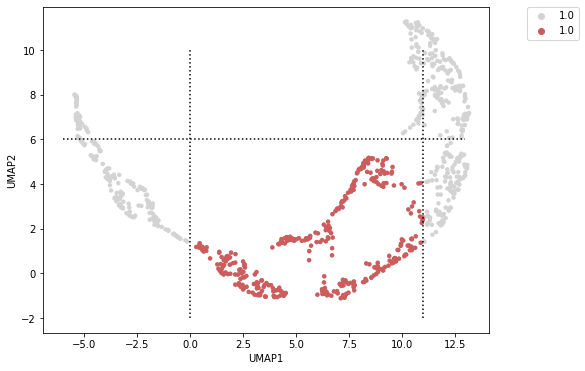

In [122]:
plt.figure(figsize=(8, 6))
            
sns.scatterplot(embedding_sub[:,0], embedding_sub[:,1], hue = np.ones(embedding_sub.shape[0]), s = 20, linewidth=0, palette = ["lightgrey"])
sns.scatterplot(embedding_include[:,0], embedding_include[:,1], hue = np.ones(embedding_include.shape[0]), s = 20, linewidth=0, palette = [color_selection[1]])
plt.vlines(0, -2, 10, linestyles ="dotted", colors ="k")
plt.vlines(11, -2, 10, linestyles ="dotted", colors ="k")
plt.hlines(6, -6, 13, linestyles ="dotted", colors ="k")
plt.ylabel('UMAP2')
plt.xlabel('UMAP1')

plt.legend(bbox_to_anchor=(1.2, 1),borderaxespad=0)
#plt.savefig('.png')
plt.show()

(375, 20)
(375, 2)
(375, 3)


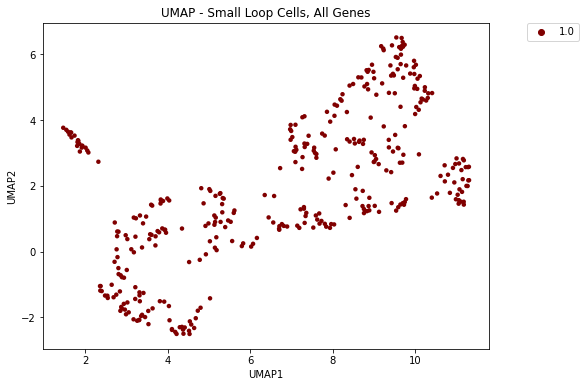

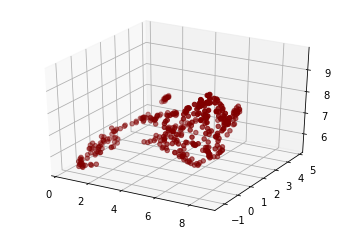

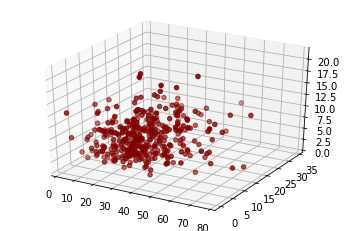

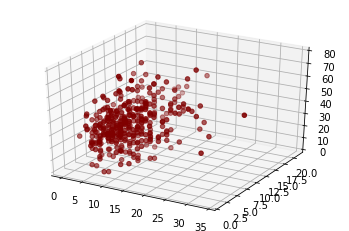

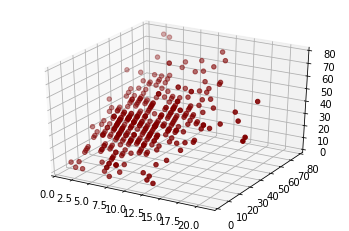

In [123]:
visualize(include_gene_expression.values, 20, 'UMAP - Small Loop Cells, All Genes', 0)

inf


c:\users\hmkri\desktop\riesenfeld pearson\lib\site-packages\ripser\ripser.py:257: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


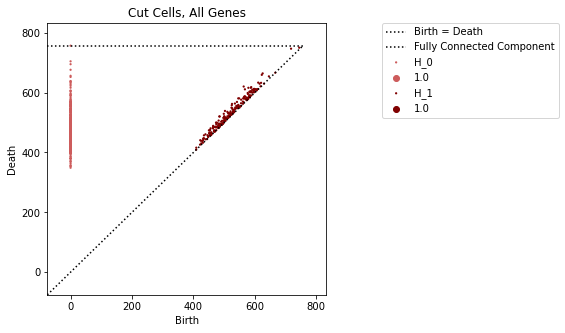

In [124]:
bd, color = persistance_diagram(include_gene_expression.values, "red", "Cut Cells, All Genes")

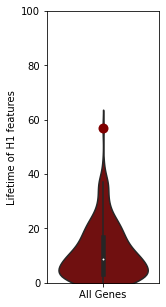

In [125]:
violin_lifetime(bd, 0, color, sublabel)

In [126]:
include_gene_expression = gene_sub[name_include]

(375, 3)
(375, 2)
(375, 3)


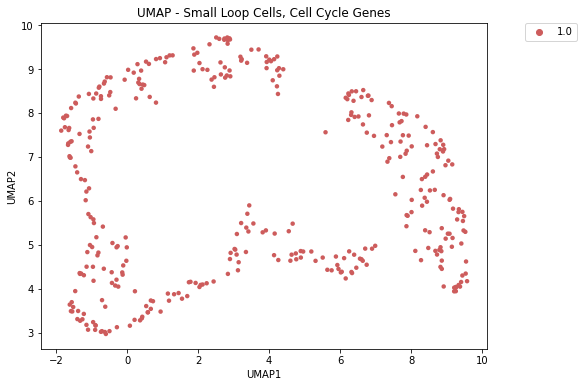

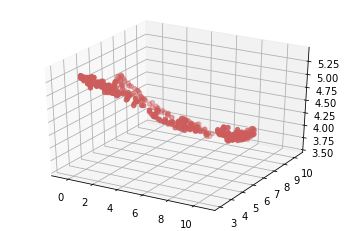

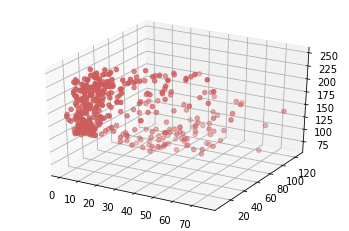

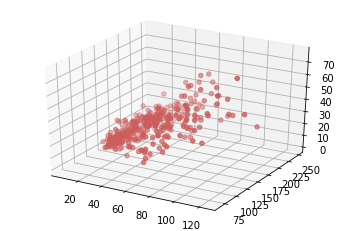

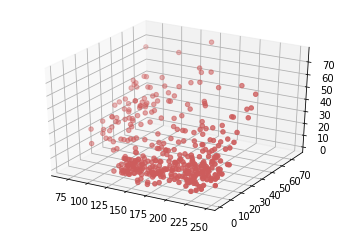

In [127]:
visualize(include_gene_expression.values, 3, 'UMAP - Small Loop Cells, Cell Cycle Genes', 1)

inf


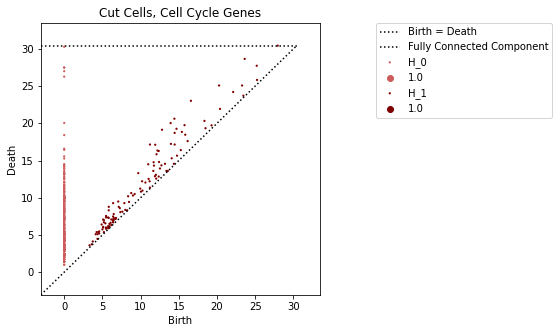

In [128]:
bd, color = persistance_diagram(include_gene_expression.values, "red", "Cut Cells, Cell Cycle Genes")

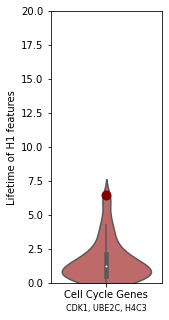

In [129]:
violin_lifetime(bd, 1, color, sublabel_cycle)

In [130]:
include_gene_expression = gene_sub_rand1[name_include]

(375, 3)
(375, 2)
(375, 3)


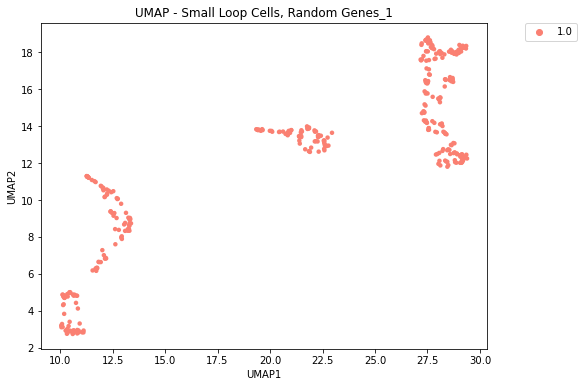

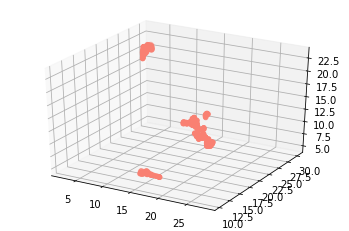

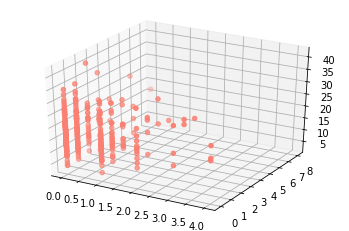

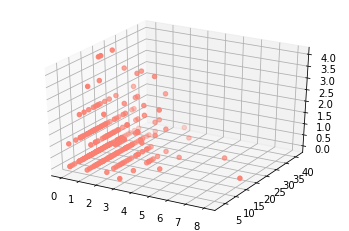

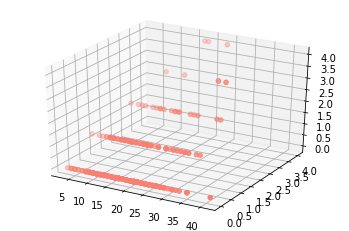

In [131]:
visualize(include_gene_expression.values, 3, 'UMAP - Small Loop Cells, Random Genes_1', 2)

inf


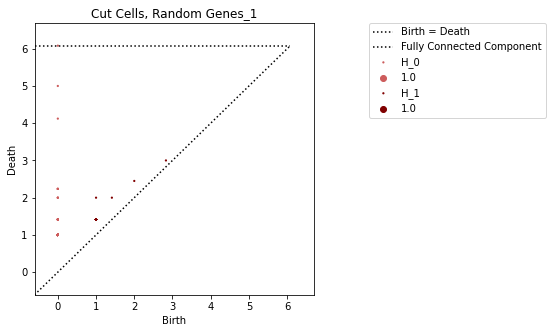

In [132]:
bd, color = persistance_diagram(include_gene_expression.values, "red", "Cut Cells, Random Genes_1")

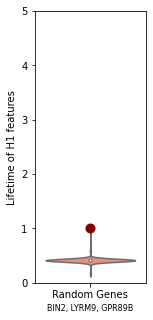

In [133]:
violin_lifetime(bd, 2, color, sublabel_1)

In [134]:
include_gene_expression = gene_sub_rand2[name_include]

(375, 3)
(375, 2)
(375, 3)


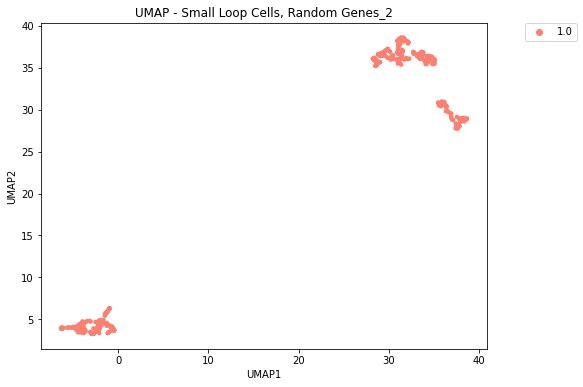

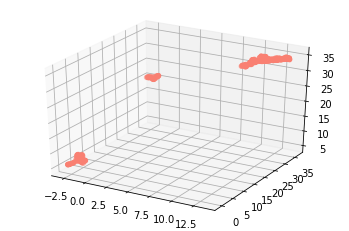

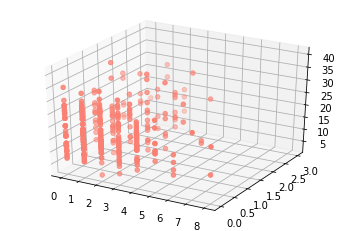

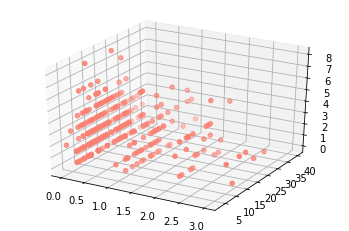

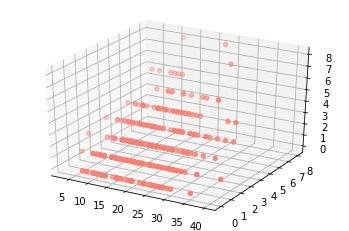

In [135]:
visualize(include_gene_expression.values, 3, 'UMAP - Small Loop Cells, Random Genes_2', 2)

inf


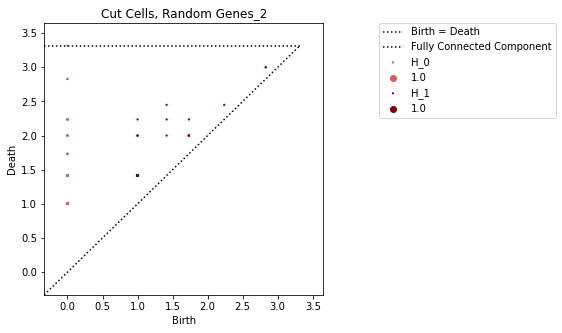

In [136]:
bd, color = persistance_diagram(include_gene_expression.values, "red", "Cut Cells, Random Genes_2")

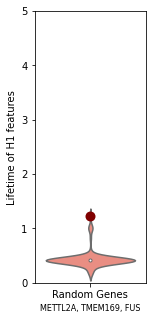

In [137]:
violin_lifetime(bd, 2, color, sublabel_2)

In [138]:
include_gene_expression = gene_sub_rand3[name_include]

(375, 3)
(375, 2)
(375, 3)


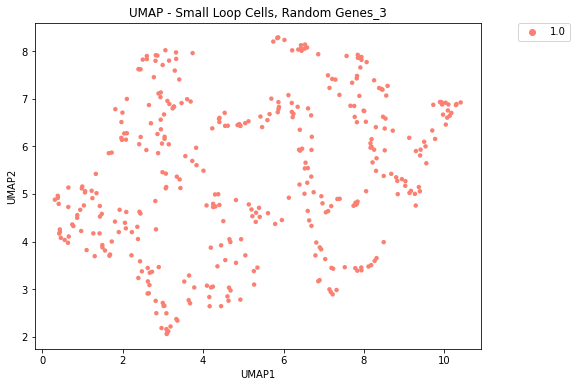

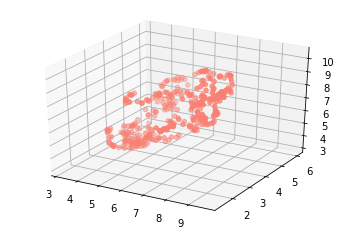

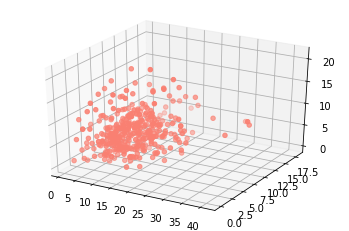

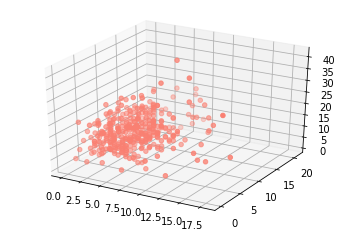

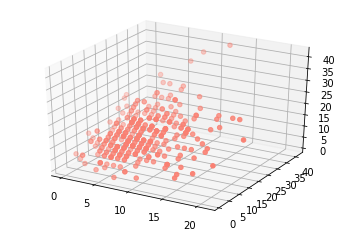

In [139]:
visualize(include_gene_expression.values, 3, 'UMAP - Small Loop Cells, Random Genes_3', 2)

inf


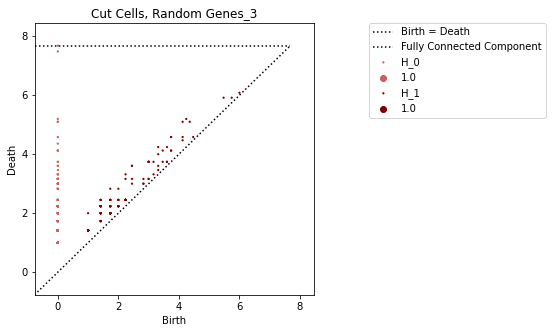

In [140]:
bd, color = persistance_diagram(include_gene_expression.values, "red", "Cut Cells, Random Genes_3")

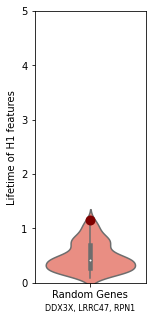

In [141]:
violin_lifetime(bd, 2, color, sublabel_3)

In [142]:
include_gene_expression = gene_sub_rand4[name_include]

(375, 3)
(375, 2)
(375, 3)


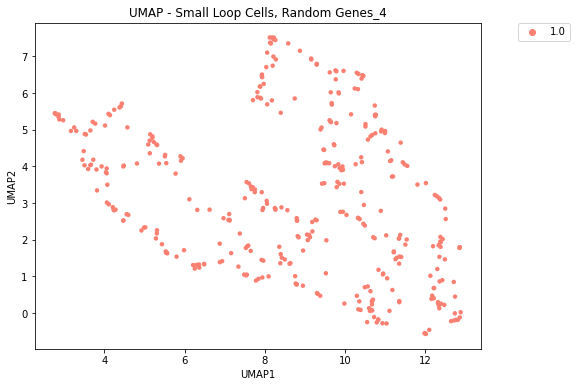

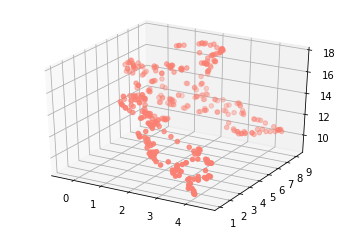

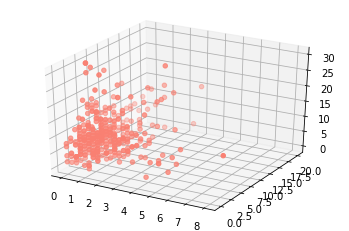

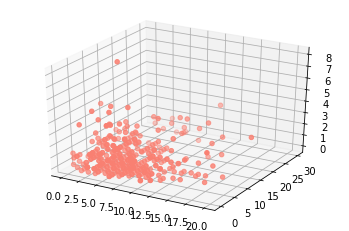

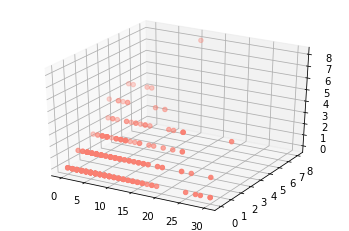

In [143]:
visualize(include_gene_expression.values, 3, 'UMAP - Small Loop Cells, Random Genes_4', 2)

inf


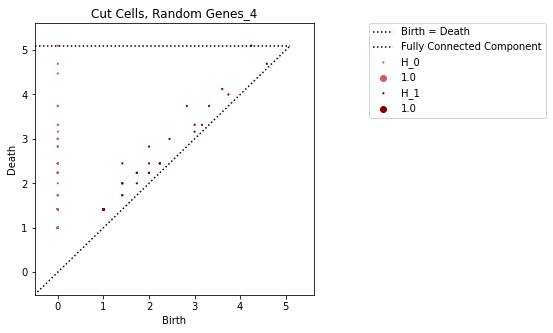

In [144]:
bd, color = persistance_diagram(include_gene_expression.values, "red", "Cut Cells, Random Genes_4")

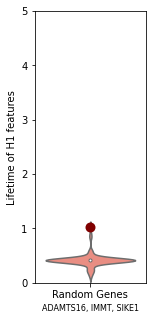

In [145]:
violin_lifetime(bd, 2, color, sublabel_4)

In [146]:
include_gene_expression = gene_sub_rand5[name_include]

(375, 3)
(375, 2)
(375, 3)


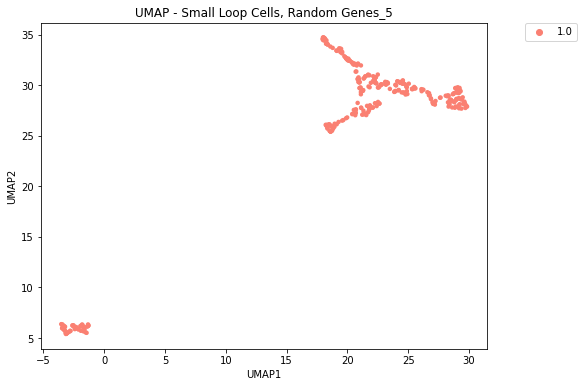

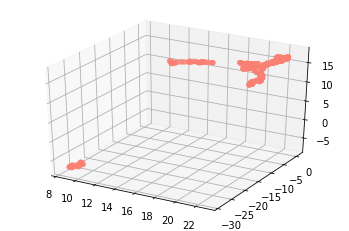

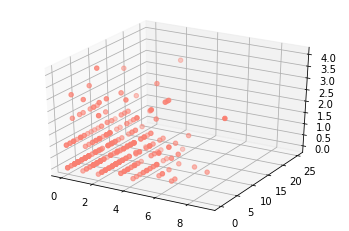

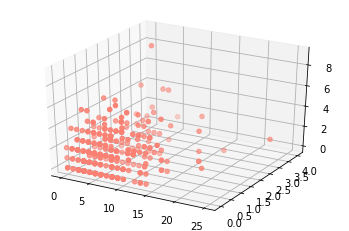

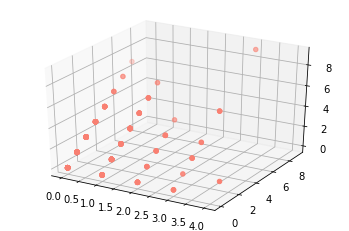

In [147]:
visualize(include_gene_expression.values, 3, 'UMAP - Small Loop Cells, Random Genes_5', 2)

inf


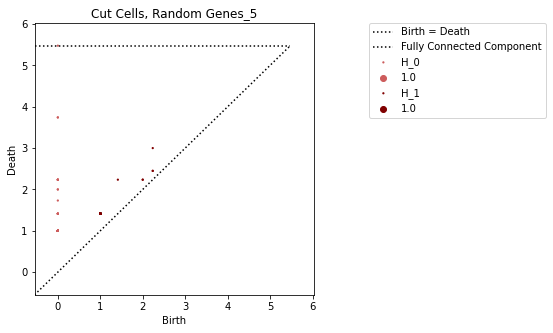

In [148]:
bd, color = persistance_diagram(include_gene_expression.values, "red", "Cut Cells, Random Genes_5")

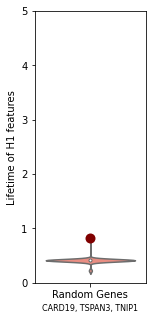

In [149]:
violin_lifetime(bd, 2, color, sublabel_5)

## Cut cycle from UMAP

In [150]:
color_selection = custom_palette.loc["purple"]

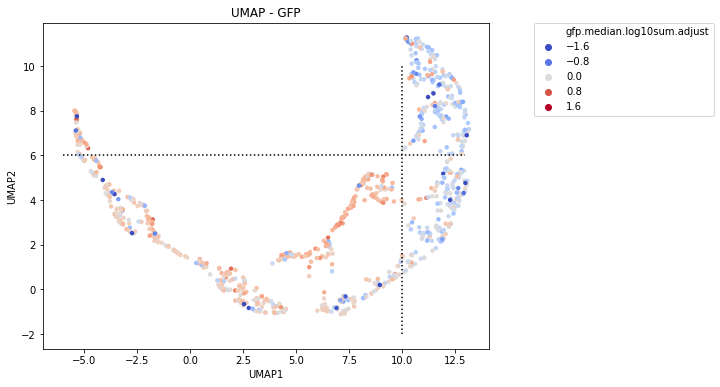

In [151]:
plt.figure(figsize=(8, 6))
            
sns.scatterplot(embedding_sub[:,0], embedding_sub[:,1], hue = labels["gfp.median.log10sum.adjust"], s = 20, linewidth=0, palette = "coolwarm", hue_norm=(-1,1))
plt.vlines(10, -2, 10, linestyles ="dotted", colors ="k")
plt.hlines(6, -6, 13, linestyles ="dotted", colors ="k")
plt.ylabel('UMAP2')
plt.xlabel('UMAP1')
plt.title('UMAP - GFP')
plt.legend(bbox_to_anchor=(1.1, 1),borderaxespad=0)
#plt.savefig('.png')
plt.show()

In [152]:
location_include = np.where((embedding_sub[:,0] > 10) & (embedding_sub[:,1] > 6))[0]
print(location_include.shape)

name_include = []
embedding_include_x = []
embedding_include_y = []

for i in range(location_include.shape[0]):
    name_include.append(gene_expression.columns[location_include[i]])  
    embedding_include_x.append(embedding_sub[location_include[i],0]) 
    embedding_include_y.append(embedding_sub[location_include[i],1]) 
    
include_gene_expression = gene_expression[name_include]
embedding_include_x = np.array(embedding_include_x)
embedding_include_y = np.array(embedding_include_y)
embedding_include_x = np.reshape(embedding_include_x, (embedding_include_x.shape[0],1))
embedding_include_y = np.reshape(embedding_include_y, (embedding_include_x.shape[0],1))

embedding_include = np.append(embedding_include_x, embedding_include_y, axis = 1)

(207,)


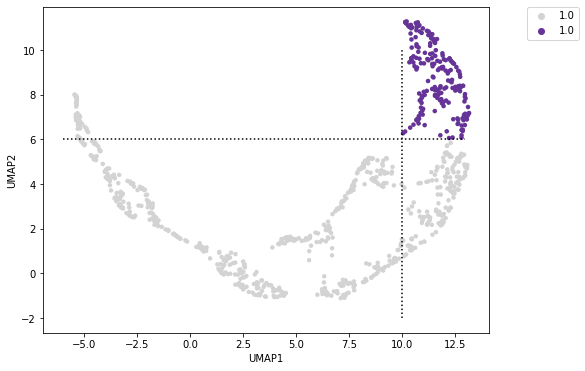

In [153]:
plt.figure(figsize=(8, 6))
            
sns.scatterplot(embedding_sub[:,0], embedding_sub[:,1], hue = np.ones(embedding_sub.shape[0]), s = 20, linewidth=0, palette = ["lightgrey"])
sns.scatterplot(embedding_include[:,0], embedding_include[:,1], hue = np.ones(embedding_include.shape[0]), s = 20, linewidth=0, palette = [color_selection[1]])
plt.vlines(10, -2, 10, linestyles ="dotted", colors ="k")
plt.hlines(6, -6, 13, linestyles ="dotted", colors ="k")
plt.ylabel('UMAP2')
plt.xlabel('UMAP1')

plt.legend(bbox_to_anchor=(1.2, 1),borderaxespad=0)
#plt.savefig('.png')
plt.show()

(207, 20)
(207, 2)
(207, 3)


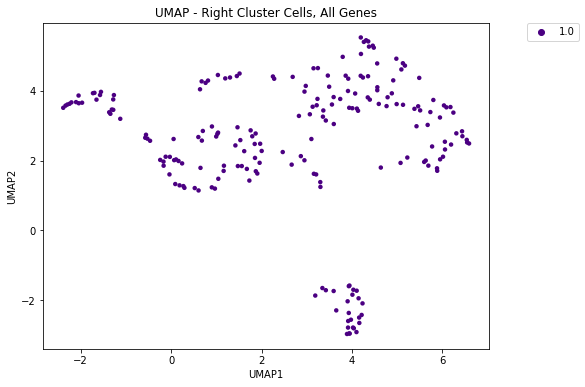

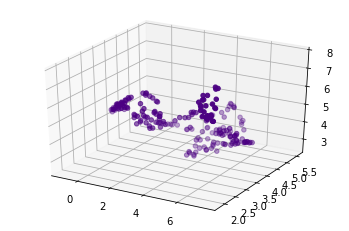

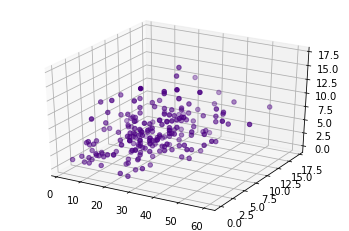

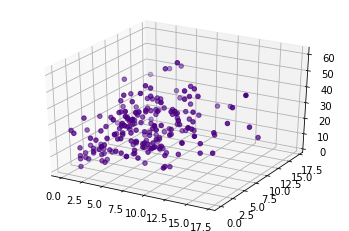

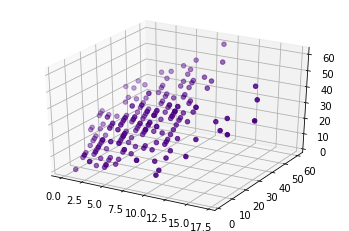

In [154]:
visualize(include_gene_expression.values, 20, 'UMAP - Right Cluster Cells, All Genes', 0)

inf


c:\users\hmkri\desktop\riesenfeld pearson\lib\site-packages\ripser\ripser.py:257: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


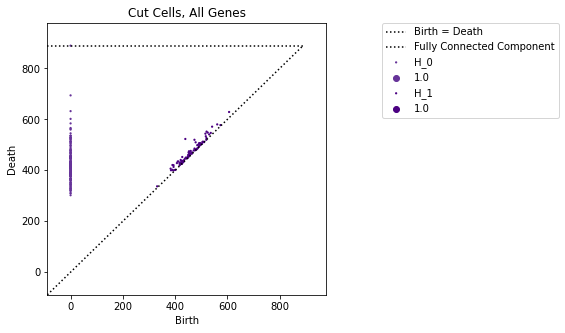

In [155]:
bd, color = persistance_diagram(include_gene_expression.values, "purple", "Cut Cells, All Genes")

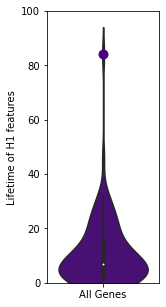

In [156]:
violin_lifetime(bd, 0, color, sublabel)

In [157]:
include_gene_expression = gene_sub[name_include]

(207, 3)
(207, 2)
(207, 3)


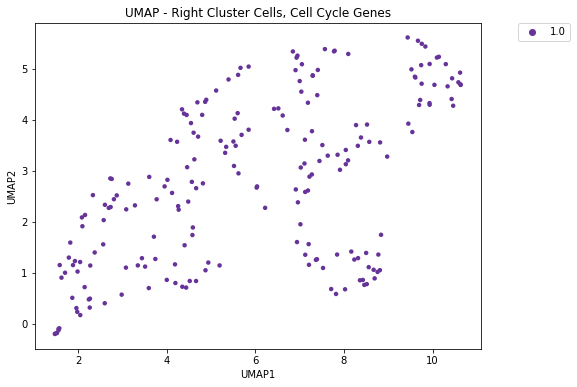

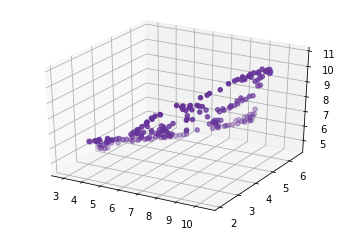

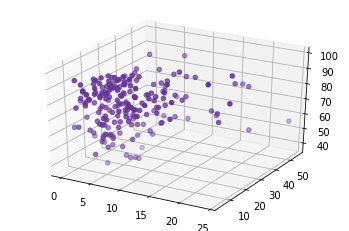

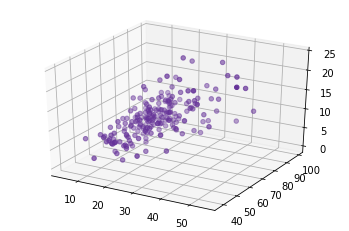

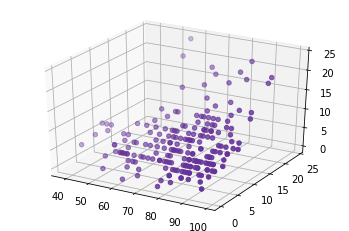

In [158]:
visualize(include_gene_expression.values, 3, 'UMAP - Right Cluster Cells, Cell Cycle Genes', 1)

inf


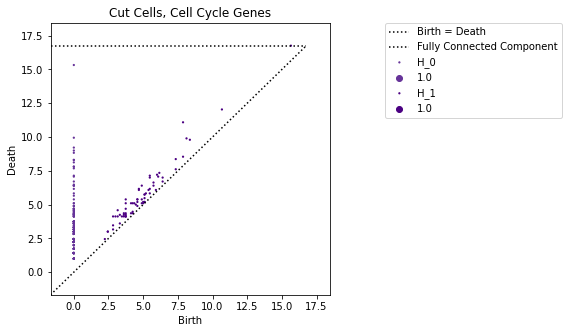

In [159]:
bd, color = persistance_diagram(include_gene_expression.values, "purple", "Cut Cells, Cell Cycle Genes")

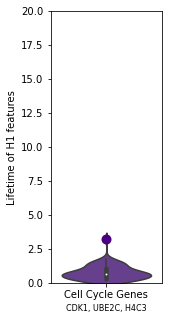

In [160]:
violin_lifetime(bd, 1, color, sublabel_cycle)

In [161]:
include_gene_expression = gene_sub_rand1[name_include]

(207, 3)
(207, 2)
(207, 3)


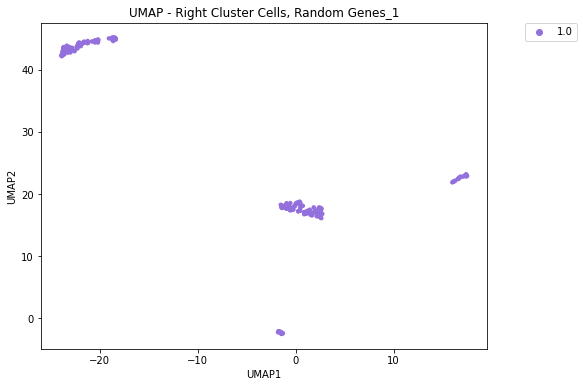

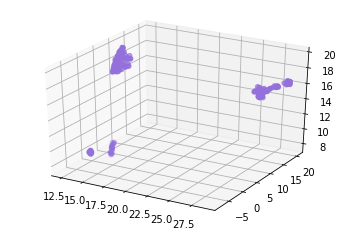

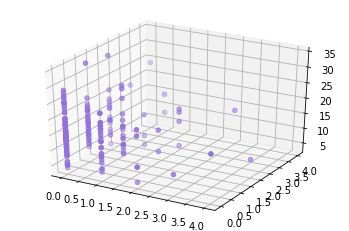

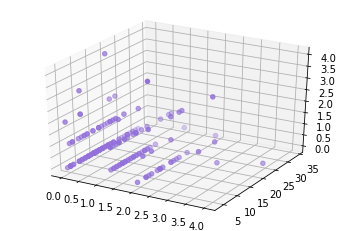

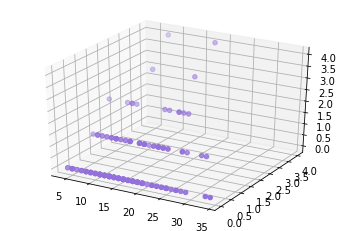

In [162]:
visualize(include_gene_expression.values, 3, 'UMAP - Right Cluster Cells, Random Genes_1', 2)

inf


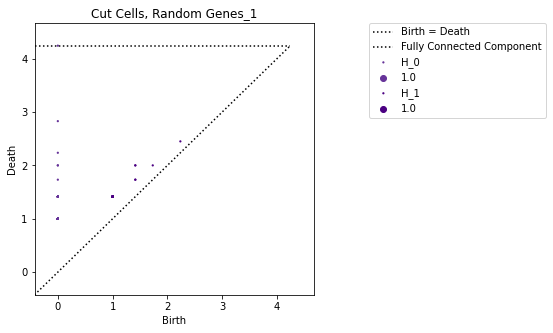

In [163]:
bd, color = persistance_diagram(include_gene_expression.values, "purple", "Cut Cells, Random Genes_1")

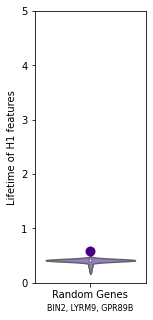

In [164]:
violin_lifetime(bd, 2, color, sublabel_1)

In [165]:
include_gene_expression = gene_sub_rand2[name_include]

(207, 3)
(207, 2)
(207, 3)


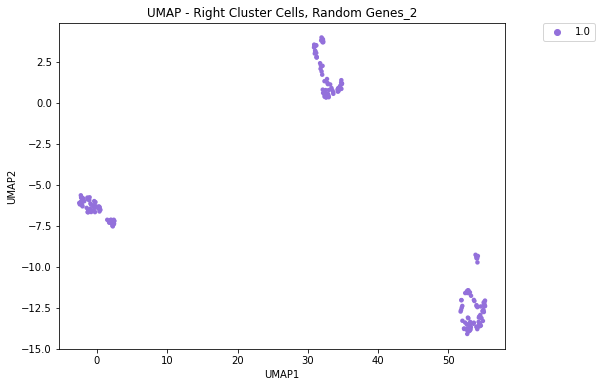

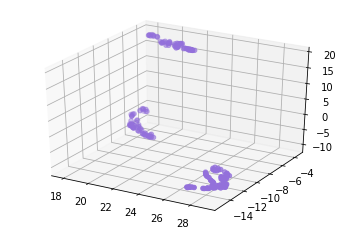

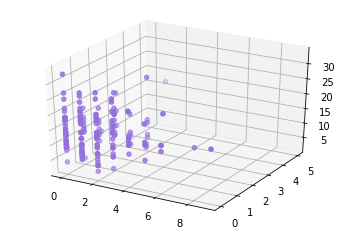

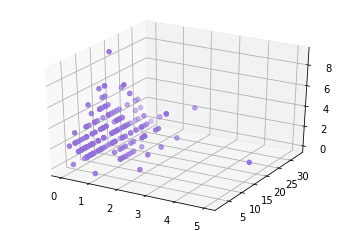

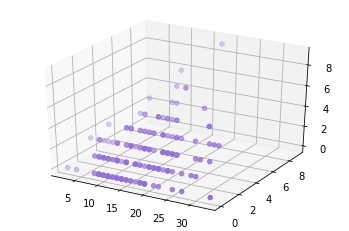

In [166]:
visualize(include_gene_expression.values, 3, 'UMAP - Right Cluster Cells, Random Genes_2', 2)

inf


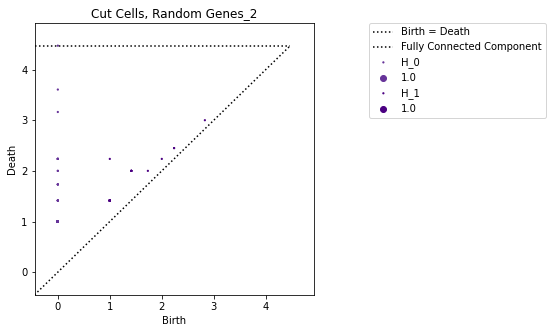

In [167]:
bd, color = persistance_diagram(include_gene_expression.values, "purple", "Cut Cells, Random Genes_2")

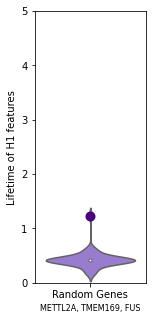

In [168]:
violin_lifetime(bd, 2, color, sublabel_2)

In [169]:
include_gene_expression = gene_sub_rand3[name_include]

(207, 3)
(207, 2)
(207, 3)


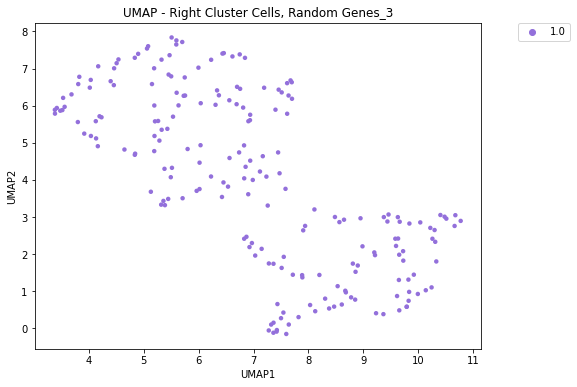

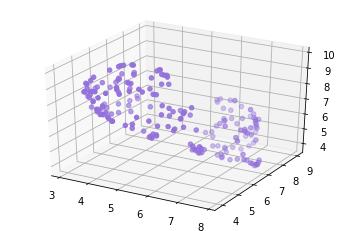

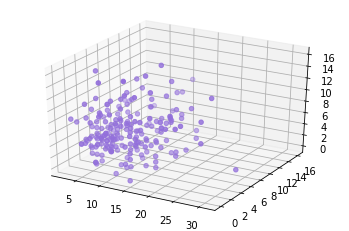

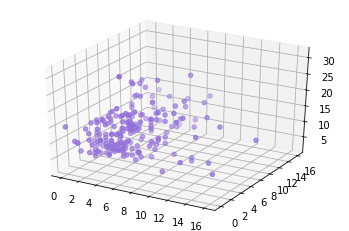

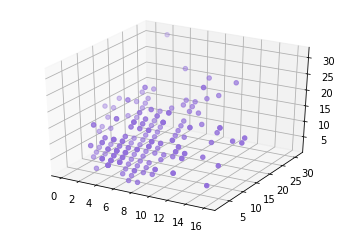

In [170]:
visualize(include_gene_expression.values, 3, 'UMAP - Right Cluster Cells, Random Genes_3', 2)

inf


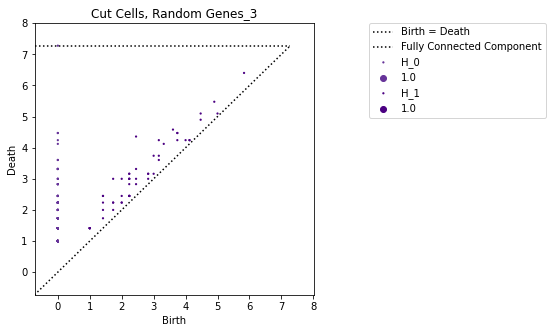

In [171]:
bd, color = persistance_diagram(include_gene_expression.values, "purple", "Cut Cells, Random Genes_3")

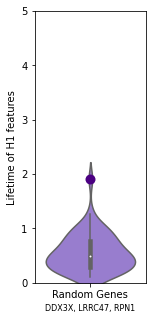

In [172]:
violin_lifetime(bd, 2, color, sublabel_3)

In [173]:
include_gene_expression = gene_sub_rand4[name_include]

(207, 3)
(207, 2)
(207, 3)


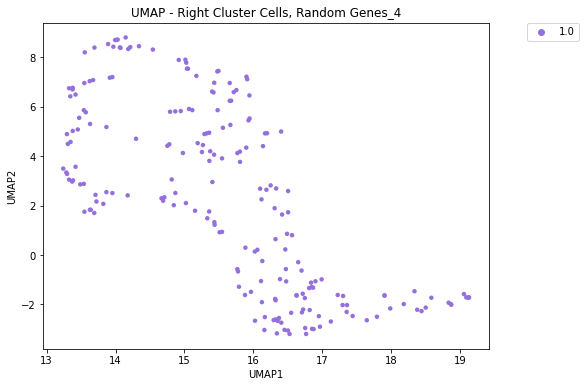

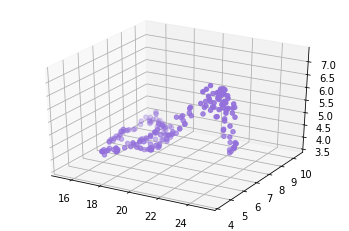

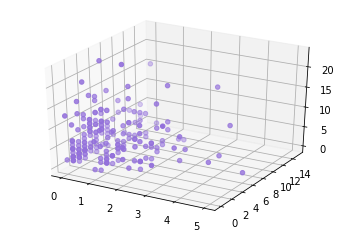

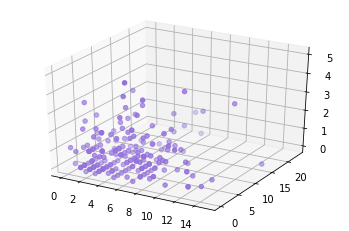

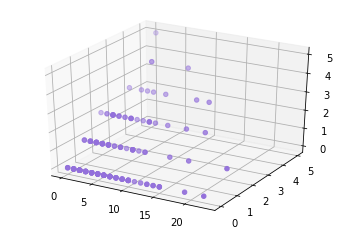

In [174]:
visualize(include_gene_expression.values, 3, 'UMAP - Right Cluster Cells, Random Genes_4', 2)

inf


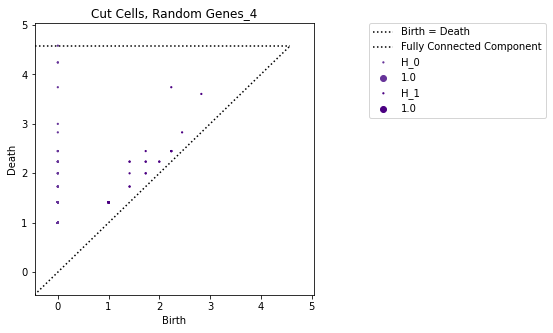

In [175]:
bd, color = persistance_diagram(include_gene_expression.values, "purple", "Cut Cells, Random Genes_4")

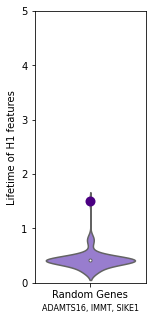

In [176]:
violin_lifetime(bd, 2, color, sublabel_4)

In [177]:
include_gene_expression = gene_sub_rand5[name_include]

(207, 3)
(207, 2)
(207, 3)


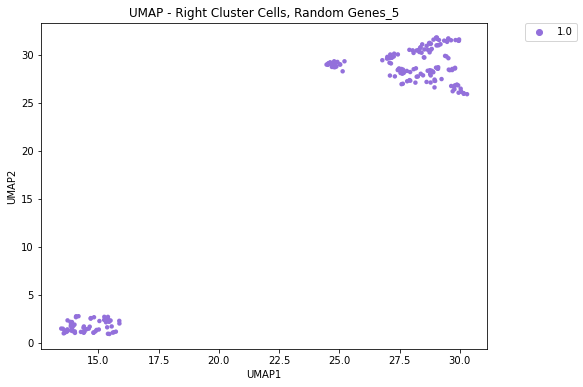

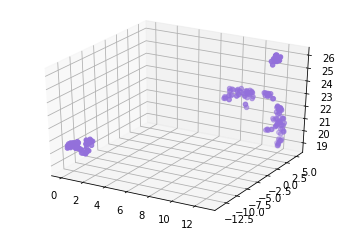

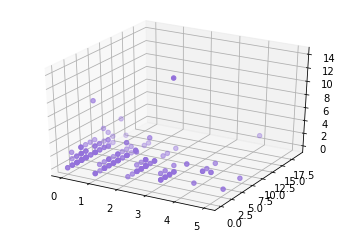

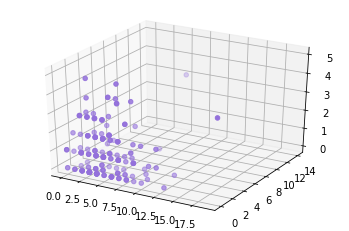

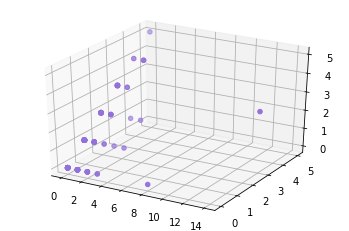

In [178]:
visualize(include_gene_expression.values, 3, 'UMAP - Right Cluster Cells, Random Genes_5', 2)

inf


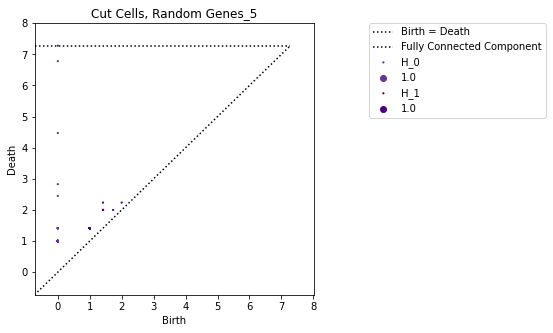

In [179]:
bd, color = persistance_diagram(include_gene_expression.values, "purple", "Cut Cells, Random Genes_5")

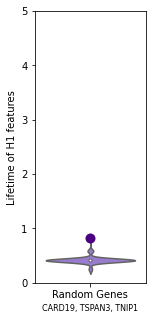

In [180]:
violin_lifetime(bd, 2, color, sublabel_5)

## Cut cycle from UMAP

In [181]:
color_selection = custom_palette.loc["teal"]

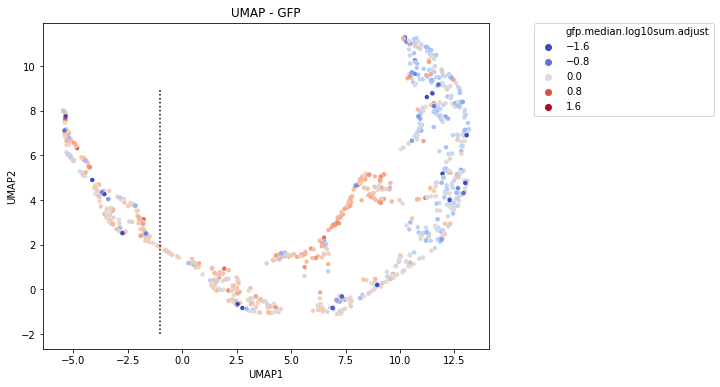

In [182]:
plt.figure(figsize=(8, 6))
            
sns.scatterplot(embedding_sub[:,0], embedding_sub[:,1], hue = labels["gfp.median.log10sum.adjust"], s = 20, linewidth=0, palette = "coolwarm", hue_norm=(-1,1))
plt.vlines(-1, -2, 9, linestyles ="dotted", colors ="k")
plt.ylabel('UMAP2')
plt.xlabel('UMAP1')
plt.title('UMAP - GFP')
plt.legend(bbox_to_anchor=(1.1, 1),borderaxespad=0)
#plt.savefig('.png')
plt.show()

In [183]:
location_include = np.where(embedding_sub[:,0] < -1)[0]
print(location_include.shape)

name_include = []
embedding_include_x = []
embedding_include_y = []

for i in range(location_include.shape[0]):
    name_include.append(gene_expression.columns[location_include[i]])  
    embedding_include_x.append(embedding_sub[location_include[i],0]) 
    embedding_include_y.append(embedding_sub[location_include[i],1]) 
    
include_gene_expression = gene_expression[name_include]
embedding_include_x = np.array(embedding_include_x)
embedding_include_y = np.array(embedding_include_y)
embedding_include_x = np.reshape(embedding_include_x, (embedding_include_x.shape[0],1))
embedding_include_y = np.reshape(embedding_include_y, (embedding_include_x.shape[0],1))

embedding_include = np.append(embedding_include_x, embedding_include_y, axis = 1)

(174,)


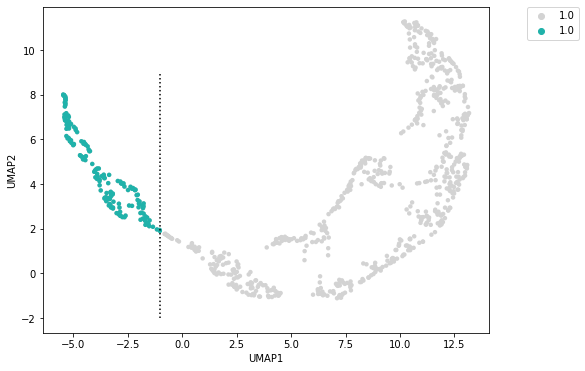

In [184]:
plt.figure(figsize=(8, 6))
            
sns.scatterplot(embedding_sub[:,0], embedding_sub[:,1], hue = np.ones(embedding_sub.shape[0]), s = 20, linewidth=0, palette = ["lightgrey"])
sns.scatterplot(embedding_include[:,0], embedding_include[:,1], hue = np.ones(embedding_include.shape[0]), s = 20, linewidth=0, palette = [color_selection[1]])
plt.vlines(-1, -2, 9, linestyles ="dotted", colors ="k")
plt.ylabel('UMAP2')
plt.xlabel('UMAP1')
plt.legend(bbox_to_anchor=(1.2, 1),borderaxespad=0)
#plt.savefig('.png')
plt.show()

(174, 20)
(174, 2)
(174, 3)


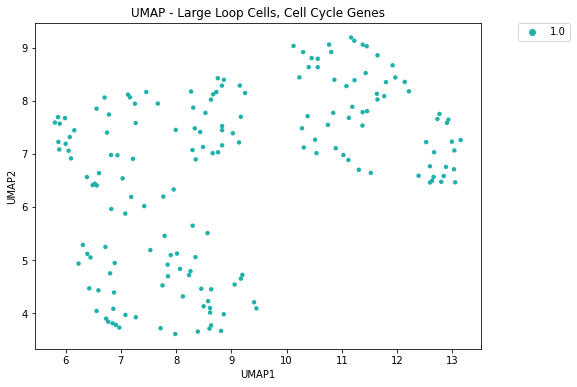

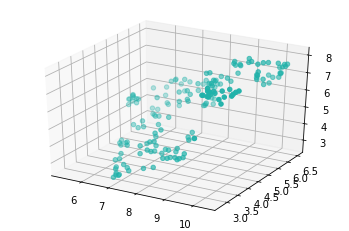

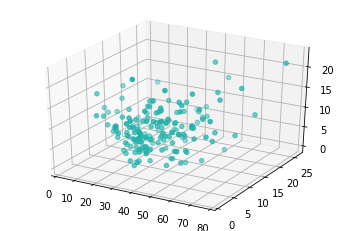

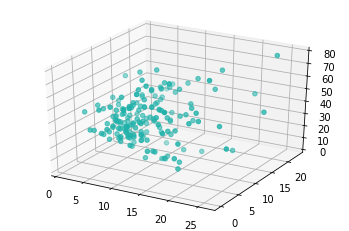

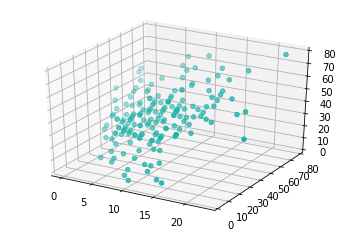

In [185]:
visualize(include_gene_expression.values, 20, 'UMAP - Large Loop Cells, Cell Cycle Genes', 1)

inf


c:\users\hmkri\desktop\riesenfeld pearson\lib\site-packages\ripser\ripser.py:257: UserWarning: The input point cloud has more columns than rows; did you mean to transpose?
  warnings.warn(


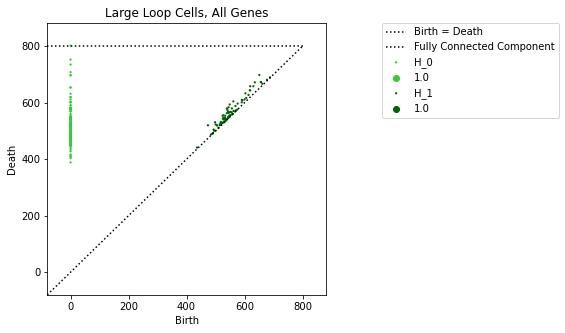

In [186]:
bd, color = persistance_diagram(include_gene_expression.values, "green", "Large Loop Cells, All Genes")

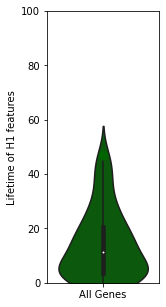

In [187]:
violin_lifetime(bd, 0, color, sublabel)

In [188]:
include_gene_expression = gene_sub[name_include]

(174, 3)
(174, 2)
(174, 3)


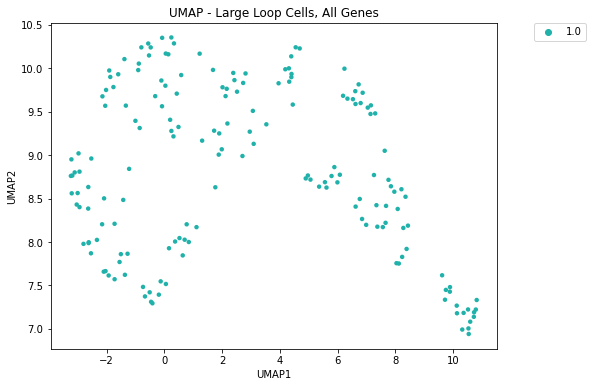

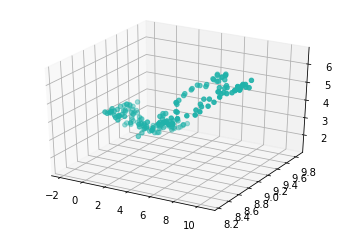

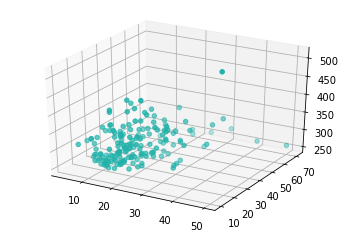

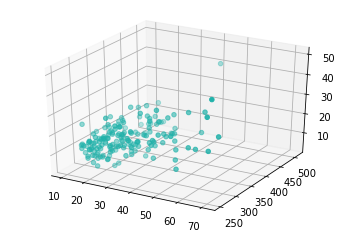

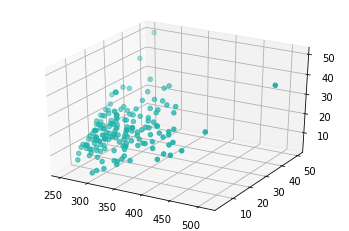

In [189]:
visualize(include_gene_expression.values, 3, 'UMAP - Large Loop Cells, All Genes', 1)

inf


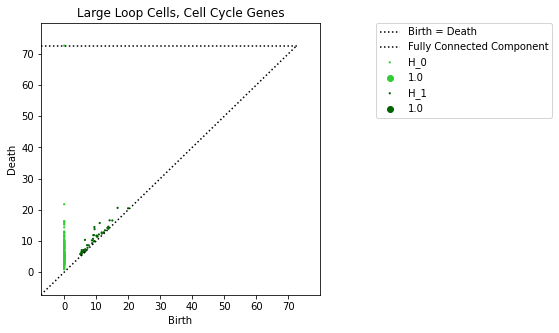

In [190]:
bd, color = persistance_diagram(include_gene_expression.values, "green", "Large Loop Cells, Cell Cycle Genes")

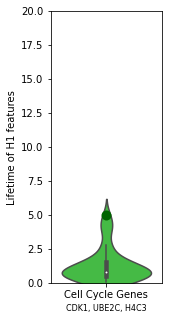

In [191]:
violin_lifetime(bd, 1, color, sublabel_cycle)

In [192]:
include_gene_expression = gene_sub_rand1[name_include]

(174, 3)
(174, 2)
(174, 3)


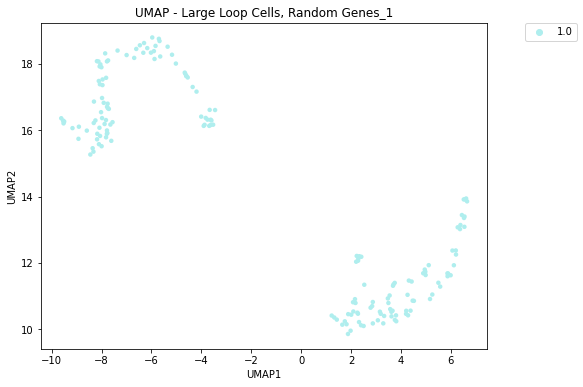

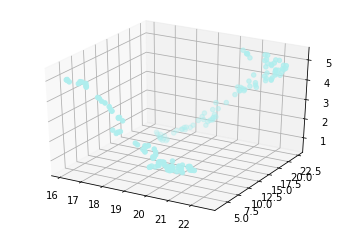

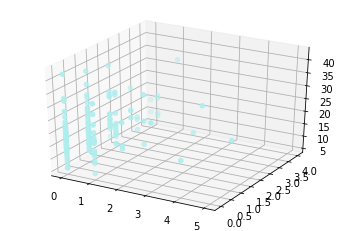

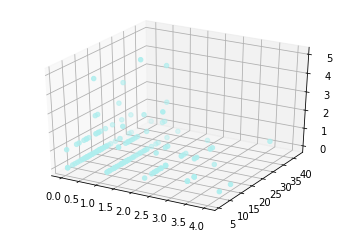

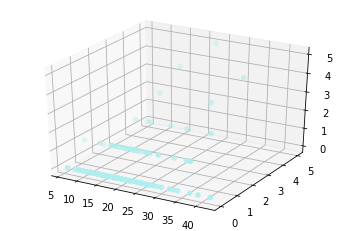

In [193]:
visualize(include_gene_expression.values, 3, 'UMAP - Large Loop Cells, Random Genes_1', 2)

inf


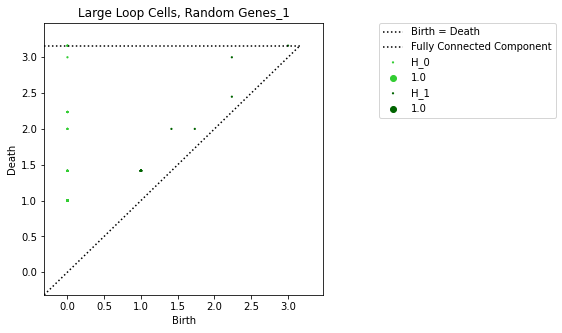

In [194]:
bd, color = persistance_diagram(include_gene_expression.values, "green", "Large Loop Cells, Random Genes_1")

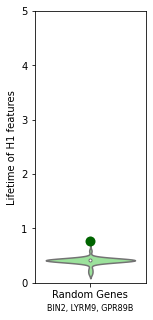

In [195]:
violin_lifetime(bd, 2, color, sublabel_1)

In [196]:
include_gene_expression = gene_sub_rand2[name_include]

(174, 3)
(174, 2)
(174, 3)


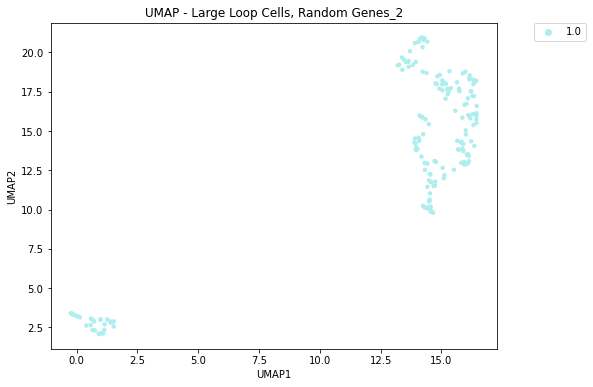

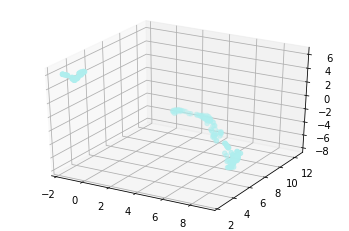

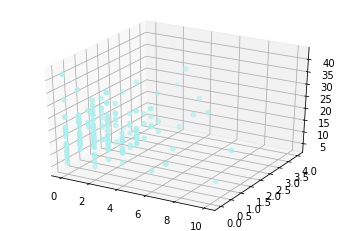

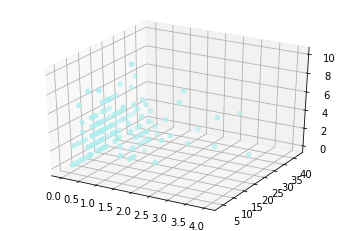

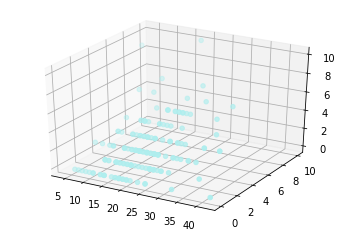

In [197]:
visualize(include_gene_expression.values, 3, 'UMAP - Large Loop Cells, Random Genes_2', 2)

inf


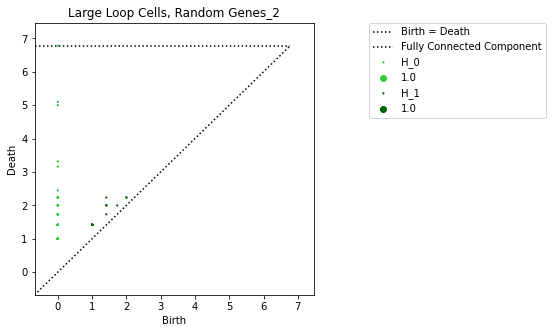

In [198]:
bd, color = persistance_diagram(include_gene_expression.values, "green", "Large Loop Cells, Random Genes_2")

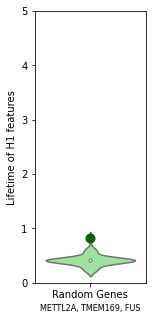

In [199]:
violin_lifetime(bd, 2, color, sublabel_2)

In [200]:
include_gene_expression = gene_sub_rand3[name_include]

(174, 3)
(174, 2)
(174, 3)


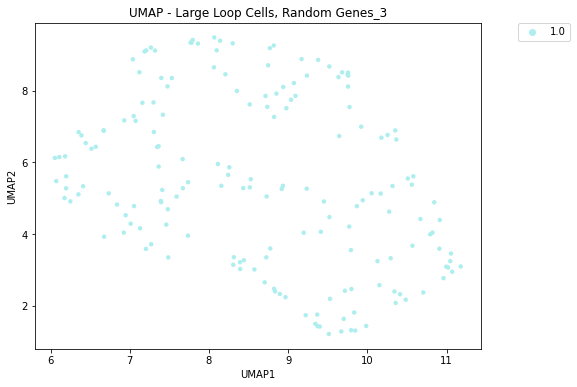

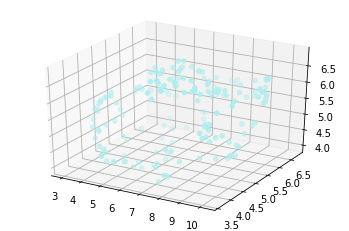

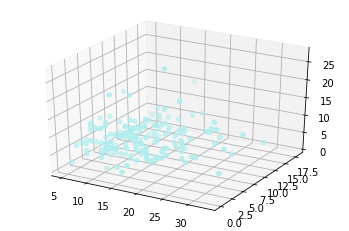

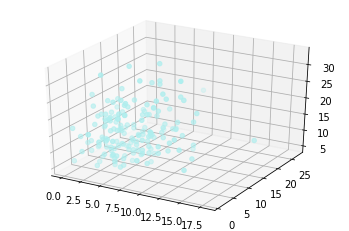

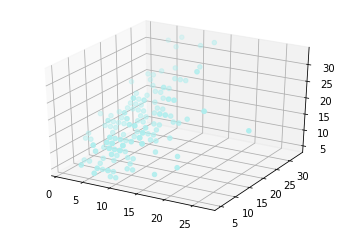

In [201]:
visualize(include_gene_expression.values, 3, 'UMAP - Large Loop Cells, Random Genes_3', 2)

inf


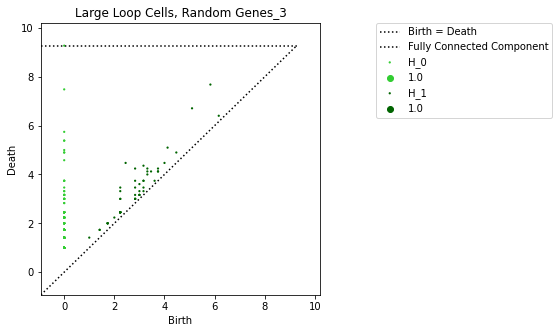

In [202]:
bd, color = persistance_diagram(include_gene_expression.values, "green", "Large Loop Cells, Random Genes_3")

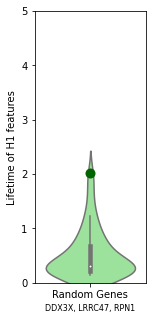

In [203]:
violin_lifetime(bd, 2, color, sublabel_3)

In [204]:
include_gene_expression = gene_sub_rand4[name_include]

(174, 3)
(174, 2)
(174, 3)


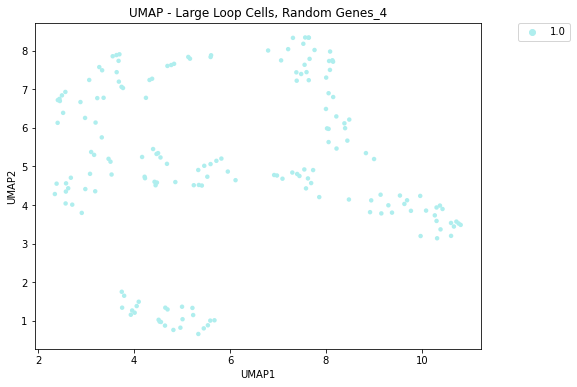

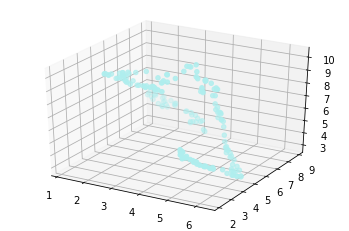

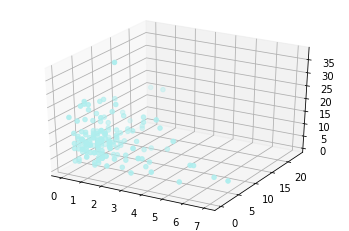

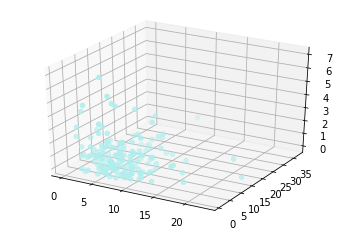

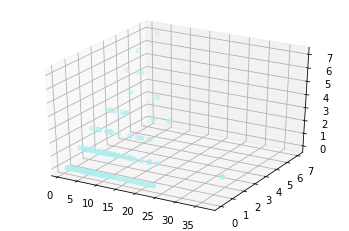

In [205]:
visualize(include_gene_expression.values, 3, 'UMAP - Large Loop Cells, Random Genes_4', 2)

inf


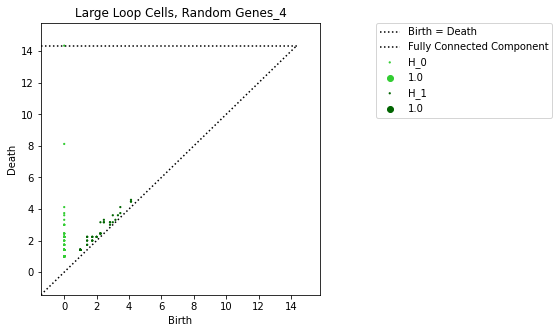

In [206]:
bd, color = persistance_diagram(include_gene_expression.values, "green", "Large Loop Cells, Random Genes_4")

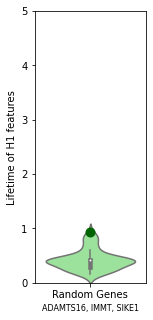

In [207]:
violin_lifetime(bd, 2, color, sublabel_4)

In [208]:
include_gene_expression = gene_sub_rand5[name_include]

(174, 3)
(174, 2)
(174, 3)


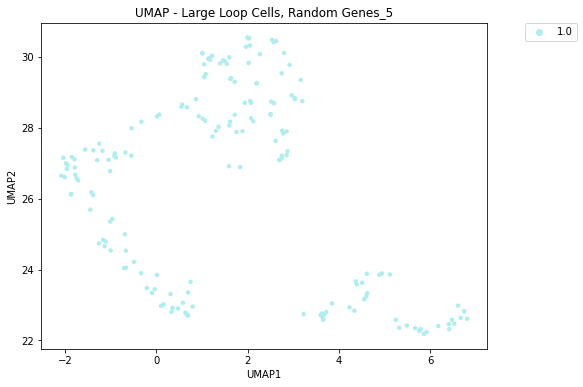

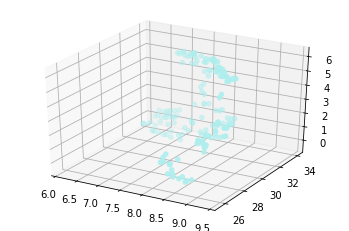

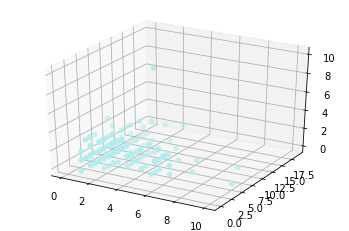

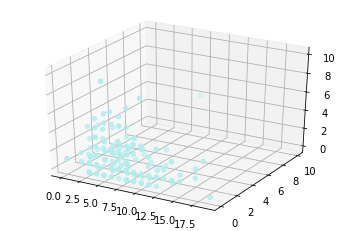

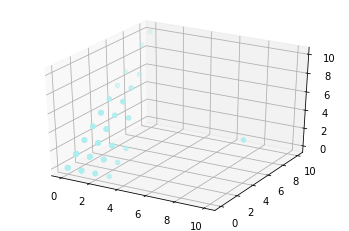

In [209]:
visualize(include_gene_expression.values, 3, 'UMAP - Large Loop Cells, Random Genes_5', 2)

inf


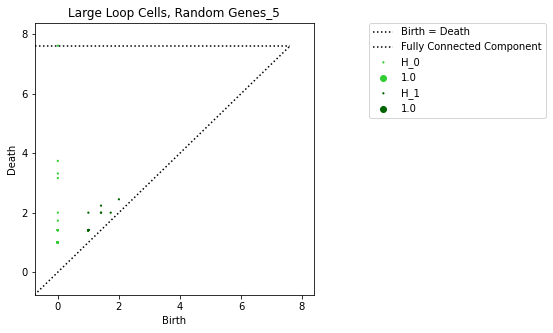

In [210]:
bd, color = persistance_diagram(include_gene_expression.values, "green", "Large Loop Cells, Random Genes_5")

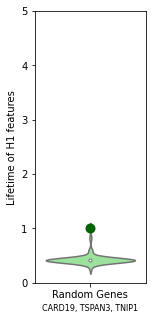

In [211]:
violin_lifetime(bd, 2, color, sublabel_5)